# Install Packages

In [ ]:
# !pip install --force-reinstall numpy==1.26.4

In [ ]:
!pip install mogptk diffrax pykoopman pydmd

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.0/35.0 MB 53.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.5/58.5 kB 616.7 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.5/136.5 kB 13.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.5/129.5 kB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.2/193.2 kB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.7/95.7 kB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.1/81.1 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.1/177.1 kB 19.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 90.0 MB/s eta 0:00:00
 

# Import Libraries

In [ ]:
# System Packages
import os
import time

# Data manipulation
import numpy as np
import pandas as pd

# Plotting
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# For Bayesian Inference
import arviz as az
import pymc as pm
import pytensor
import pytensor.tensor as pt
from numba import njit
from pymc.ode import DifferentialEquation
from pytensor.compile.ops import as_op
from scipy.integrate import odeint, solve_ivp
from scipy.optimize import least_squares
from scipy.signal import detrend, savgol_filter

# MOGPTK
import torch
import mogptk

# NCDE
import diffrax
import equinox as eqx  # https://github.com/patrick-kidger/equinox
import jax
import jax.nn as jnn
import jax.numpy as jnp
import jax.random as jr
import jax.scipy as jsp
import optax  # https://github.com/deepmind/optax

# PyKoopman
import pykoopman as pk
from pydmd import DMD

# Performance metrics
from sklearn.metrics import r2_score
import networkx as nx

THEANO_FLAGS = "optimizer=fast_compile"

print(f"PyMC3 Version: {pm.__version__}")
print(f"NumPy Version: {np.__version__}")
print(f"PyTensor Version: {pytensor.__version__}")

ImportError: cannot import name 'IncEx' from 'pydantic.main' (/usr/local/lib/python3.11/dist-packages/pydantic/main.py)

# Import Tempo Mouse Aorta Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
thesis_path = "/content/drive/MyDrive/Grad_Stuff/Masters/Research Thesis/"
plots_path = os.path.join(thesis_path, "plots/")
plots_mouse_path = os.path.join(plots_path, "mouse/")
data_path = os.path.join(thesis_path, "data/")
tempo_path = os.path.join(data_path, "mouse_tempo/")

tempo_df = pd.read_csv(os.path.join(tempo_path, "mouse_data.csv"))
tempo_df = tempo_df.rename(columns={'Time (hours)':'time'})

tempo_df = tempo_df.iloc[:, 1:] # remove unnamed: 0 field

# remove negatives by shifting everything up by min val
min_val = tempo_df.iloc[:, 1:].min().min()
eps = 1.5
tempo_df.iloc[:, 1:] += abs(min_val) + eps

tempo_df.head()

,time,Npas2,Per2,Cry2,Fbxo3,Rorc,Ciart,Per3,Clock,Fbxo21,...,Per1,Hlf,Nr1d1,Csnk1d,Nampt,Nfil3,Nr1d2,Csnk1e,Tef,Csnk1a1
0,0.000000,7.748220,8.399048,8.331121,9.193899,2.073665,4.865835,7.330227,9.424263,7.845094,...,8.029243,8.567511,7.718639,9.046535,8.722518,9.684439,7.429942,9.064943,8.437274,10.960244
1,0.484848,7.737764,8.408289,8.331713,9.193955,2.136715,4.856487,7.341687,9.422155,7.840329,...,8.029931,8.573825,7.647963,9.046801,8.728349,9.691761,7.410793,9.063074,8.442865,10.959572
2,0.969697,7.722093,8.419966,8.333171,9.193990,2.197673,4.855644,7.361011,9.418639,7.835724,...,8.033195,8.584293,7.583739,9.047062,8.735818,9.694723,7.400305,9.061656,8.454886,10.958823
3,1.454545,7.701457,8.433894,8.335473,9.194004,2.255559,4.863321,7.387887,9.413772,7.831353,...,8.038982,8.598745,7.526998,9.047312,8.744806,9.693278,7.398648,9.060711,8.473146,10.958011
4,1.939394,7.676190,8.449848,8.338581,9.193996,2.309441,4.879394,7.421883,9.407632,7.827287,...,8.047199,8.616949,7.478654,9.047548,8.755168,9.687448,7.405848,9.060254,8.497349,10.957147


# Helper Functions Across Methods

In [ ]:
def regular_mse(pred_df, true_df):
  """
  pred_df: dataframe of predictions of shape (n_timepoints, n_genes)
  true_df: dataframe of true values of shape (n_timepoints, n_genes)
  """

  return np.mean((true_df - pred_df) ** 2)


def pooled_mse(pred_df, true_df):
  """
  pred_df: dataframe of predictions of shape (n_timepoints, n_genes)
  true_df: dataframe of true values of shape (n_timepoints, n_genes)
  """

  return np.mean(np.mean((pred_df - true_df) ** 2, axis = 0))



In [ ]:
tempo_df.columns

Index(['time', 'Npas2', 'Per2', 'Cry2', 'Fbxo3', 'Rorc', 'Ciart', 'Per3',
       'Clock', 'Fbxo21', 'Bhlhe41', 'Arntl2', 'Dbp', 'Arntl', 'Rora', 'Cry1',
       'Per1', 'Hlf', 'Nr1d1', 'Csnk1d', 'Nampt', 'Nfil3', 'Nr1d2', 'Csnk1e',
       'Tef', 'Csnk1a1'],
      dtype='object')

In [ ]:
tempo_df


,time,Npas2,Per2,Cry2,Fbxo3,Rorc,Ciart,Per3,Clock,Fbxo21,...,Per1,Hlf,Nr1d1,Csnk1d,Nampt,Nfil3,Nr1d2,Csnk1e,Tef,Csnk1a1
0,0.000000,7.748220,8.399048,8.331121,9.193899,2.073665,4.865835,7.330227,9.424263,7.845094,...,8.029243,8.567511,7.718639,9.046535,8.722518,9.684439,7.429942,9.064943,8.437274,10.960244
1,0.484848,7.737764,8.408289,8.331713,9.193955,2.136715,4.856487,7.341687,9.422155,7.840329,...,8.029931,8.573825,7.647963,9.046801,8.728349,9.691761,7.410793,9.063074,8.442865,10.959572
2,0.969697,7.722093,8.419966,8.333171,9.193990,2.197673,4.855644,7.361011,9.418639,7.835724,...,8.033195,8.584293,7.583739,9.047062,8.735818,9.694723,7.400305,9.061656,8.454886,10.958823
3,1.454545,7.701457,8.433894,8.335473,9.194004,2.255559,4.863321,7.387887,9.413772,7.831353,...,8.038982,8.598745,7.526998,9.047312,8.744806,9.693278,7.398648,9.060711,8.473146,10.958011
4,1.939394,7.676190,8.449848,8.338581,9.193996,2.309441,4.879394,7.421883,9.407632,7.827287,...,8.047199,8.616949,7.478654,9.047548,8.755168,9.687448,7.405848,9.060254,8.497349,10.957147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,46.060606,7.735823,8.388806,8.337401,9.193487,1.821000,4.983294,7.364760,9.418286,7.864213,...,8.051848,8.584789,8.041938,9.045496,8.717033,9.614910,7.585023,9.076220,8.479452,10.961977
96,46.545455,7.747042,8.387232,8.334571,9.193615,1.882181,4.942745,7.344220,9.421916,7.859580,...,8.042536,8.574161,7.957588,9.045743,8.715655,9.637827,7.535614,9.072915,8.459465,10.961703
97,47.030303,7.752896,8.388435,8.332562,9.193728,1.945366,4.909314,7.331504,9.424142,7.854798,...,8.035596,8.567680,7.874707,9.046002,8.716119,9.657253,7.492859,9.069903,8.445642,10.961318
98,47.515152,7.753291,8.392395,8.331406,9.193823,2.009538,4.883539,7.326814,9.424929,7.849944,...,8.031141,8.565452,7.794627,9.046267,8.718420,9.672874,7.457445,9.067231,8.438205,10.960829


In [ ]:
# List of genes in order
genes = [
    'Npas2', 'Per2', 'Cry2', 'Fbxo3', 'Rorc', 'Ciart', 'Per3',
    'Clock', 'Fbxo21', 'Bhlhe41', 'Arntl2', 'Dbp', 'Arntl', 'Rora',
    'Cry1', 'Per1', 'Hlf', 'Nr1d1', 'Csnk1d', 'Nampt', 'Nfil3',
    'Nr1d2', 'Csnk1e', 'Tef', 'Csnk1a1'
]

# Initialize adjacency matrix with zeros
adjacency = pd.DataFrame(0, index=genes, columns=genes)

# Define known interactions (activation +1, repression -1)

# Npas2/Clock/Arntl complex activates Per/Cry/Dbp/etc
for activator in ['Npas2', 'Clock']:
    for target in ['Per1', 'Per2', 'Per3', 'Cry1', 'Cry2', 'Dbp', 'Tef', 'Hlf', 'Arntl2']:
        adjacency.loc[activator, target] = 1

# Rorc/Rora activate Arntl
for activator in ['Rorc', 'Rora']:
    adjacency.loc[activator, 'Arntl'] = 1
    adjacency.loc[activator, 'Arntl2'] = 1

# Per/Cry inhibit Npas2/Clock/Arntl
for repressor in ['Per1', 'Per2', 'Per3', 'Cry1', 'Cry2']:
    for target in ['Npas2', 'Clock', 'Arntl', 'Arntl2']:
        adjacency.loc[repressor, target] = -1

# Nr1d1/Nr1d2 repress Arntl
for repressor in ['Nr1d1', 'Nr1d2']:
    adjacency.loc[repressor, 'Arntl'] = -1
    adjacency.loc[repressor, 'Arntl2'] = -1

# Csnk1d, Csnk1e phosphorylate Per and Cry (post-translational repression)
for kinase in ['Csnk1d', 'Csnk1e', 'Csnk1a1']:
    for substrate in ['Per1', 'Per2', 'Per3', 'Cry1', 'Cry2']:
        adjacency.loc[kinase, substrate] = -1

# Optional: Fbxo3/Fbxo21/Nampt/Nfil3 currently no direct transcriptional interactions known
# Leaving them as 0

# Display adjacency matrix
true_adjacency = adjacency.copy()
true_adjacency

,Npas2,Per2,Cry2,Fbxo3,Rorc,Ciart,Per3,Clock,Fbxo21,Bhlhe41,...,Per1,Hlf,Nr1d1,Csnk1d,Nampt,Nfil3,Nr1d2,Csnk1e,Tef,Csnk1a1
Npas2,0,1,1,0,0,0,1,0,0,0,...,1,1,0,0,0,0,0,0,1,0
Per2,-1,0,0,0,0,0,0,-1,0,0,...,0,0,0,0,0,0,0,0,0,0
Cry2,-1,0,0,0,0,0,0,-1,0,0,...,0,0,0,0,0,0,0,0,0,0
Fbxo3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rorc,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Ciart,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Per3,-1,0,0,0,0,0,0,-1,0,0,...,0,0,0,0,0,0,0,0,0,0
Clock,0,1,1,0,0,0,1,0,0,0,...,1,1,0,0,0,0,0,0,1,0
Fbxo21,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Bhlhe41,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# G = nx.Graph()

# G.add_edge('KaiA', 'KaiC-P', weight=1)
# G.add_edge('KaiB', 'KaiC-P', weight=-1)
# G.add_edge('KaiA', 'KaiB', weight=-1)
# G.add_edge('SasA', 'RpaA', weight=1)
# G.add_edge('RpaA', 'RpaA-P', weight=-1)
# G.add_edge('RpaA-P', 'DNA', weight=1)
# G.add_edge('KaiC-P', 'DNA', weight=1)
# G.add_edge('KaiA', 'DNA', weight=1)
# G.add_edge('KaiB', 'DNA', weight=1)

# G.adjacency()

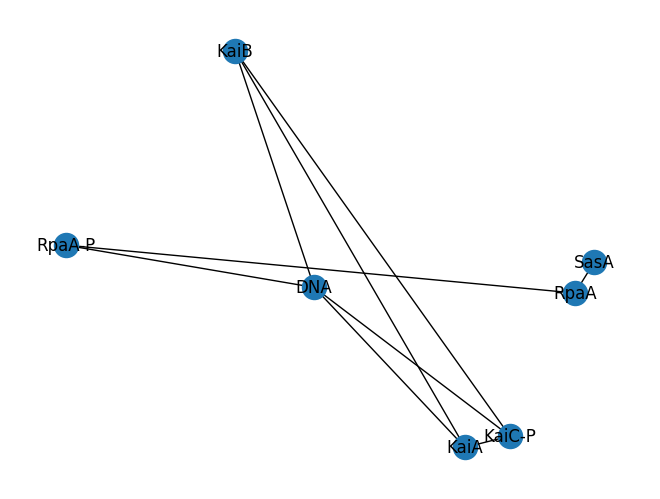

In [ ]:
# nx.draw(G, with_labels = True)

In [ ]:
# true_adjacency = nx.to_pandas_adjacency(G, nodelist = G.nodes())
# true_adjacency = true_adjacency.loc[tempo_df.columns[1:],
#                                     tempo_df.columns[1:]]
# true_adjacency

In [ ]:
def binarize(x):
  if x > 0:
    return 1
  elif x < 0:
    return -1
  else:
    return 0

def compare_coupling(pred_df, true_df):
  """
  pred_df: dataframe of predictions of shape (n_timepoints, n_genes)
  true_df: dataframe of true values of shape (n_timepoints, n_genes)
  """
  binary_pred = pred_df.map(binarize)
  return np.linalg.norm(binary_pred - true_df)



# Transform Data

<ipython-input-17-2746e1e77342>:7: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, "mouse_original_dataset.png"))
<ipython-input-17-2746e1e77342>:7: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, "mouse_original_dataset.png"))
<ipython-input-17-2746e1e77342>:7: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, "mouse_original_dataset.png"))
<ipython-input-17-2746e1e77342>:7: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longe

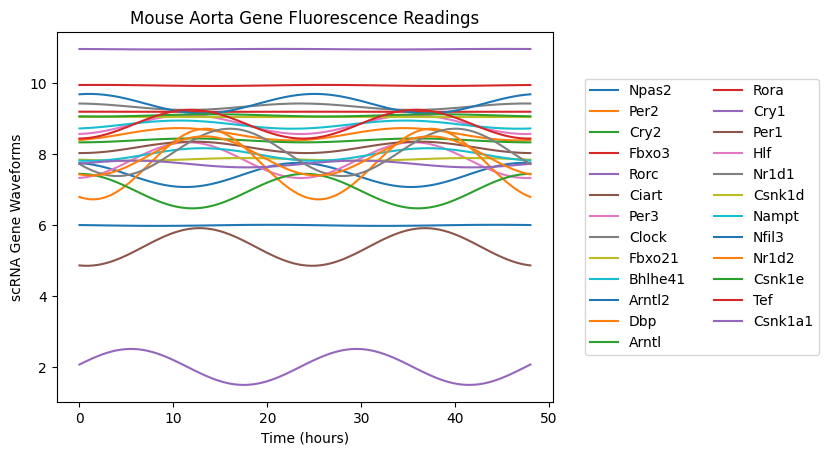

In [ ]:
tempo_df.plot(x = 'time')

plt.xlabel('Time (hours)')
plt.ylabel('scRNA Gene Waveforms')
plt.title('Mouse Aorta Gene Fluorescence Readings')
plt.legend(bbox_to_anchor=(1.05, 0.5), ncol=2, loc='center left')
plt.savefig(os.path.join(plots_mouse_path, "mouse_original_dataset.png"))
plt.show()

In [ ]:
# Get colnames
clock_cols = tempo_df\
  .drop(['time'], axis = 1, inplace = False)\
  .columns.tolist()


In [ ]:
len(clock_cols)

25

# MOGP

## MOGP Configs

In [ ]:
tempo_df

,time,Npas2,Per2,Cry2,Fbxo3,Rorc,Ciart,Per3,Clock,Fbxo21,...,Per1,Hlf,Nr1d1,Csnk1d,Nampt,Nfil3,Nr1d2,Csnk1e,Tef,Csnk1a1
0,0.000000,7.748220,8.399048,8.331121,9.193899,2.073665,4.865835,7.330227,9.424263,7.845094,...,8.029243,8.567511,7.718639,9.046535,8.722518,9.684439,7.429942,9.064943,8.437274,10.960244
1,0.484848,7.737764,8.408289,8.331713,9.193955,2.136715,4.856487,7.341687,9.422155,7.840329,...,8.029931,8.573825,7.647963,9.046801,8.728349,9.691761,7.410793,9.063074,8.442865,10.959572
2,0.969697,7.722093,8.419966,8.333171,9.193990,2.197673,4.855644,7.361011,9.418639,7.835724,...,8.033195,8.584293,7.583739,9.047062,8.735818,9.694723,7.400305,9.061656,8.454886,10.958823
3,1.454545,7.701457,8.433894,8.335473,9.194004,2.255559,4.863321,7.387887,9.413772,7.831353,...,8.038982,8.598745,7.526998,9.047312,8.744806,9.693278,7.398648,9.060711,8.473146,10.958011
4,1.939394,7.676190,8.449848,8.338581,9.193996,2.309441,4.879394,7.421883,9.407632,7.827287,...,8.047199,8.616949,7.478654,9.047548,8.755168,9.687448,7.405848,9.060254,8.497349,10.957147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,46.060606,7.735823,8.388806,8.337401,9.193487,1.821000,4.983294,7.364760,9.418286,7.864213,...,8.051848,8.584789,8.041938,9.045496,8.717033,9.614910,7.585023,9.076220,8.479452,10.961977
96,46.545455,7.747042,8.387232,8.334571,9.193615,1.882181,4.942745,7.344220,9.421916,7.859580,...,8.042536,8.574161,7.957588,9.045743,8.715655,9.637827,7.535614,9.072915,8.459465,10.961703
97,47.030303,7.752896,8.388435,8.332562,9.193728,1.945366,4.909314,7.331504,9.424142,7.854798,...,8.035596,8.567680,7.874707,9.046002,8.716119,9.657253,7.492859,9.069903,8.445642,10.961318
98,47.515152,7.753291,8.392395,8.331406,9.193823,2.009538,4.883539,7.326814,9.424929,7.849944,...,8.031141,8.565452,7.794627,9.046267,8.718420,9.672874,7.457445,9.067231,8.438205,10.960829


In [ ]:
TRAIN_HIST = 40
TRAIN_HIST

40

## MOGP Data Prep

In [ ]:
mogptk_data = mogptk.DataSet()

for i, clock_col in enumerate(clock_cols):
    mogptk_data.append(mogptk.Data(tempo_df['time'], tempo_df[clock_col], name = clock_col))
    mogptk_data.transform(mogptk.TransformDetrend(degree=1))
    mogptk_data[i].remove_range(start = TRAIN_HIST)
    # mogptk_data[i].remove_range(start = 0, end = 30)
    # mogptk_data[i] # remove frome nd

(<Figure size 1200x10000 with 25 Axes>,
 array([[<AxesSubplot:title={'center':'Npas2'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Per2'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Cry2'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Fbxo3'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Rorc'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Ciart'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Per3'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Clock'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Fbxo21'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Bhlhe41'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Arntl2'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Dbp'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'Arntl'}, xlabel='X', ylabel='Y'>],


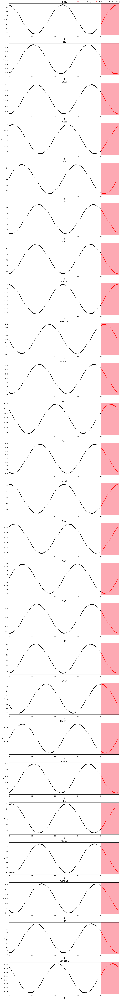

In [ ]:
mogptk_data.plot()

## MOGP Training

In [ ]:
# create model, uncomment for different kernels
mogptk_model = mogptk.MOSM(mogptk_data, Q=4)
# mogptk_model = mogptk.CSM(mogptk_data, Q=4)
# mogptk_model = mogptk.SM_LMC(mogptk_data, Q=2)
# mogptk_model = mogptk.CONV(mogptk_data, Q=2)

# initialize parameters of kernel using LombScargle
mogptk_model.init_parameters(method='BNSE', iters=10)

Starting optimization using Adam
‣ Model: Exact
  ‣ Kernel: MultiOutputSpectralMixtureKernel
  ‣ Likelihood: GaussianLikelihood
‣ Channels: 25
‣ Parameters: 525
‣ Training points: 2075
‣ Iterations: 10
   0/10   0:00:02  loss=    -2502.03  error=   0.0387725
   4/10   0:00:12  loss=    -3283.71  error=   0.0201253
   8/10   0:00:21  loss=    -3363.64  error=   0.0186991
  10/10   0:00:26  loss=    -3372.51  error=   0.0231821
Optimization finished in 26.981 seconds


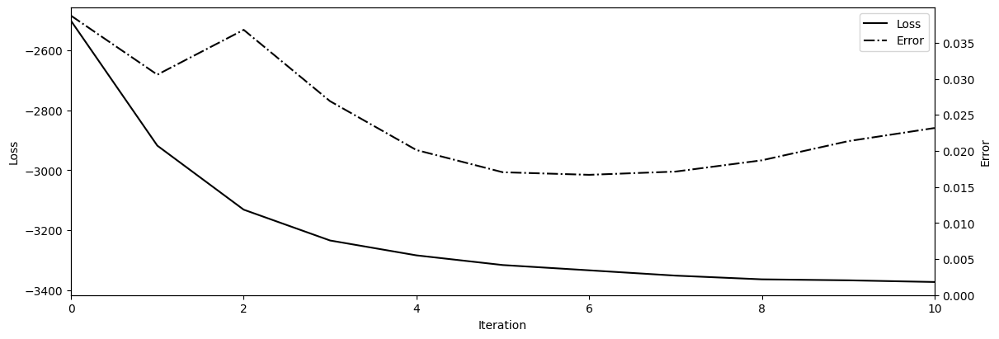

In [ ]:
mogptk_model.train(method='Adam', lr=0.02, iters=10, plot=True, error='MSE', verbose=True);

## MOGP Prediction

### Capture predictions in dataframe

In [ ]:
mogptk_time, mogptk_mu, mogptk_lower_ci, mogptk_upper_ci = mogptk_model.predict(
    X=None,
    ci=None,
    sigma=2,
    n=10000,
    transformed=False
)

In [ ]:
mogptk_mu[0].shape

(100,)

In [ ]:
mogptk_preds_df = pd.DataFrame(mogptk_mu,
                               index = tempo_df.iloc[:, 1:].columns.tolist()).T
mogptk_preds_df.insert(0, 'time', tempo_df['time'].values)
mogptk_preds_df

,time,Npas2,Per2,Cry2,Fbxo3,Rorc,Ciart,Per3,Clock,Fbxo21,...,Per1,Hlf,Nr1d1,Csnk1d,Nampt,Nfil3,Nr1d2,Csnk1e,Tef,Csnk1a1
0,0.000000,7.661809,8.411136,8.331279,9.194442,2.074743,4.773656,7.340422,9.401447,7.824440,...,8.023919,8.572582,7.356659,9.046230,8.731320,9.769196,7.367749,9.057324,8.455132,10.959446
1,0.484848,7.684027,8.418649,8.332971,9.194328,2.113752,4.774884,7.358691,9.407609,7.824335,...,8.028190,8.582393,7.345922,9.046404,8.736390,9.744053,7.359256,9.057342,8.468823,10.959378
2,0.969697,7.698930,8.428305,8.335596,9.194207,2.157887,4.784302,7.383514,9.411860,7.823934,...,8.035192,8.595668,7.338607,9.046610,8.742897,9.717781,7.358339,9.057665,8.487803,10.959149
3,1.454545,7.705779,8.440043,8.339080,9.194081,2.205359,4.801601,7.414488,9.413997,7.823169,...,8.044708,8.612198,7.333827,9.046841,8.750781,9.690947,7.364768,9.058292,8.511693,10.958760
4,1.939394,7.704110,8.453782,8.343330,9.193955,2.254142,4.826442,7.451190,9.413883,7.822025,...,8.056472,8.631758,7.330921,9.047091,8.759974,9.664006,7.378336,9.059222,8.540093,10.958221
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,46.060606,7.955218,8.364180,8.339882,9.191616,1.966581,5.017846,7.355025,9.478679,7.904797,...,8.061826,8.578588,8.529653,9.046110,8.703079,9.237996,7.625815,9.087665,8.480205,10.964691
96,46.545455,7.926834,8.356524,8.336629,9.191802,1.994003,4.953983,7.321832,9.471844,7.899470,...,8.051065,8.561099,8.426440,9.046403,8.697871,9.277272,7.554616,9.082542,8.454607,10.963809
97,47.030303,7.888204,8.352059,8.334020,9.191992,2.013616,4.897325,7.296783,9.462218,7.893602,...,8.042201,8.547948,8.320416,9.046657,8.694716,9.317061,7.490158,9.077658,8.435078,10.962773
98,47.515152,7.840528,8.350814,8.332121,9.192182,2.026311,4.849036,7.280407,9.450102,7.887401,...,8.035448,8.539413,8.212893,9.046867,8.693647,9.356466,7.433866,9.073101,8.422083,10.961610


### Modifying MOGPTK plot_prediction


Want to plot a square facet grid

In [ ]:
def plot_prediction(mogptk_model,
                    X=None,
                    title=None,
                    figsize=None,
                    legend=True,
                    errorbars=True,
                    nrows = None,
                    ncols = None,
                    suptitle=None,
                    supfontsize=40,
                    subfontsize=20,
                    ci=None,
                    sigma=2,
                    n=10000,
                    transformed=False):
    """
    Plot the data including removed observations, latent function, and predictions of this model for each channel.

    Args:
        X (list, dict): Array of shape (data_points,), (data_points,input_dims), or [(data_points,)] * input_dims per channel with prediction X values. If a dictionary is passed, the index is the channel index or name.
        title (str): Set the title of the plot.
        figsize (tuple): Set the figure size.
        legend (boolean): Disable legend.
        errorbars (boolean): Plot data error bars if available.
        ci (float,list of float): Confidence interval as a percentage or the two quantile limits [lower, upper] in the range of [0,1].
        sigma (float): Number of standard deviations to display upwards and downwards.
        n (int): Number of samples used from distribution to estimate quantile.
        transformed (boolean): Display transformed Y data as used for training.

    Returns:
        matplotlib.figure.Figure: The figure.
        list of matplotlib.axes.Axes: List of axes.

    Examples:
        >>> fig, axes = dataset.plot(title='Title')
    """
    X, Mu, Lower, Upper = mogptk_model.predict(X, ci=ci, sigma=sigma, n=n, transformed=transformed)
    if len(mogptk_model.dataset) == 1:
        X = [X]
        Mu = [Mu]
        Lower = [Lower]
        Upper = [Upper]

    if figsize is None:
        figsize = (12,4*len(mogptk_model.dataset))

    if nrows == None and ncols == None:
        nrows = len(mogptk_model.dataset)
        ncols = 1

    fig, ax = plt.subplots(nrows = nrows,
                           ncols = ncols,
                           figsize=figsize,
                           squeeze=False,
                           constrained_layout=True)
    for j, data in enumerate(mogptk_model.dataset):
        r, c = divmod(j, ncols)

        # TODO: ability to plot conditional or marginal distribution to reduce input dims
        if data.get_input_dims() > 2:
            raise ValueError("cannot plot more than two input dimensions")
        if data.get_input_dims() == 2:
            raise NotImplementedError("two dimensional input data not yet implemented") # TODO

        legends = []
        if errorbars and data.Y_err is not None:
            x, y = data.get_train_data(transformed=transformed)
            yl = data.Y[data.mask] - data.Y_err[data.mask]
            yu = data.Y[data.mask] + data.Y_err[data.mask]
            if transformed:
                yl = data.Y_transformer.forward(yl, x)
                yu = data.Y_transformer.forward(yu, x)
            x = x.astype(data.X_dtypes[0])
            ax[j,0].errorbar(x, y, [y-yl, yu-y], elinewidth=1.5, ecolor='lightgray', capsize=0, ls='', marker='')

        # prediction
        idx = np.argsort(X[j][:,0])
        x = X[j][idx,0].astype(data.X_dtypes[0])
        ax[r, c].plot(x, Mu[j][idx], ls=':', color='blue', lw=2)
        if not np.all(Lower[j][idx] == Mu[j][idx]) and not np.all(Upper[j][idx] == Mu[j][idx]):
            ax[r, c].fill_between(x, Lower[j][idx], Upper[j][idx], color='blue', alpha=0.3)
            legends.append(patches.Rectangle(
                (1, 1), 1, 1, fill=True, color='blue', alpha=0.3, lw=0, label='95% Error Bars'
            ))
        legends.append(plt.Line2D([0], [0], ls=':', color='blue', lw=2, label='Posterior Mean'))

        xmin = min(np.min(data.X), np.min(X[j]))
        xmax = max(np.max(data.X), np.max(X[j]))
        if data.F is not None:
            if np.issubdtype(data.X_dtypes[0], np.datetime64):
                dt = np.timedelta64(1,data.X.get_time_unit())
                n = int((xmax-xmin) / dt) + 1
                x = np.arange(xmin, xmax+np.timedelta64(1,'us'), dt, dtype=data.X_dtypes[0])
            else:
                n = len(data.X)*10
                x = np.linspace(xmin, xmax, n)

            y = data.F(x)
            if transformed:
                y = data.Y_transformer.forward(y, x)

            ax[r, c].plot(x, y, 'g--', lw=1)
            legends.append(plt.Line2D([0], [0], ls='--', color='g', label='Latent'))

        if data.has_test_data():
            x, y = data.get_test_data(transformed=transformed)
            x = x.astype(data.X_dtypes[0])
            ax[r, c].plot(x, y, 'r.', ms=10)
            legends.append(plt.Line2D([0], [0], ls='', color='r', marker='.', ms=10, label='Test data'))

        x, y = data.get_train_data(transformed=transformed)
        x = x.astype(data.X_dtypes[0])
        ax[r, c].plot(x, y, 'k.', ms=10)
        legends.append(plt.Line2D([0], [0], ls='', color='k', marker='.', ms=10, label='Train data'))

        if 0 < len(data.removed_ranges[0]):
            for removed_range in data.removed_ranges[0]:
                x0 = removed_range[0].astype(data.X_dtypes[0])
                x1 = removed_range[1].astype(data.X_dtypes[0])
                y0 = ax[r, c].get_ylim()[0]
                y1 = ax[r, c].get_ylim()[1]
                ax[r, c].add_patch(patches.Rectangle(
                    (x0, y0), x1-x0, y1-y0, fill=True, color='xkcd:strawberry', alpha=0.4, lw=0,
                ))
            legends.insert(0, patches.Rectangle(
                (1, 1), 1, 1, fill=True, color='xkcd:strawberry', alpha=0.4, lw=0, label='Removed Ranges'
            ))

        xmin = xmin.astype(data.X_dtypes[0])
        xmax = xmax.astype(data.X_dtypes[0])
        ax[r, c].set_xlim(xmin-(xmax-xmin)*0.001, xmax+(xmax-xmin)*0.001)
        ax[r, c].set_xlabel(data.X_labels[0])
        ax[r, c].set_ylabel(data.Y_label)
        ax[r, c].set_title(data.name if title is None else title, fontsize=subfontsize)

        ax[r, c].tick_params(axis='both', which='major', labelsize=24)
        ax[r, c].tick_params(axis='both', which='minor', labelsize=20)


        # plt.legend(handles=legends[::-1])
    fig.supxlabel('Time (hours)', fontsize = 50)
    fig.supylabel('scRNA-seq Readings', fontsize = 50)
    fig.suptitle(suptitle, fontsize=supfontsize)

    if legend:
      fig.legend(handles=legends[::-1], bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize= 50)
    return fig, ax

<ipython-input-27-c04e746767ce>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, "mogptk_tempo2_q4_mosm.png"))
<ipython-input-27-c04e746767ce>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, "mogptk_tempo2_q4_mosm.png"))
<ipython-input-27-c04e746767ce>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, "mogptk_tempo2_q4_mosm.png"))
<ipython-input-27-c04e746767ce>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no long

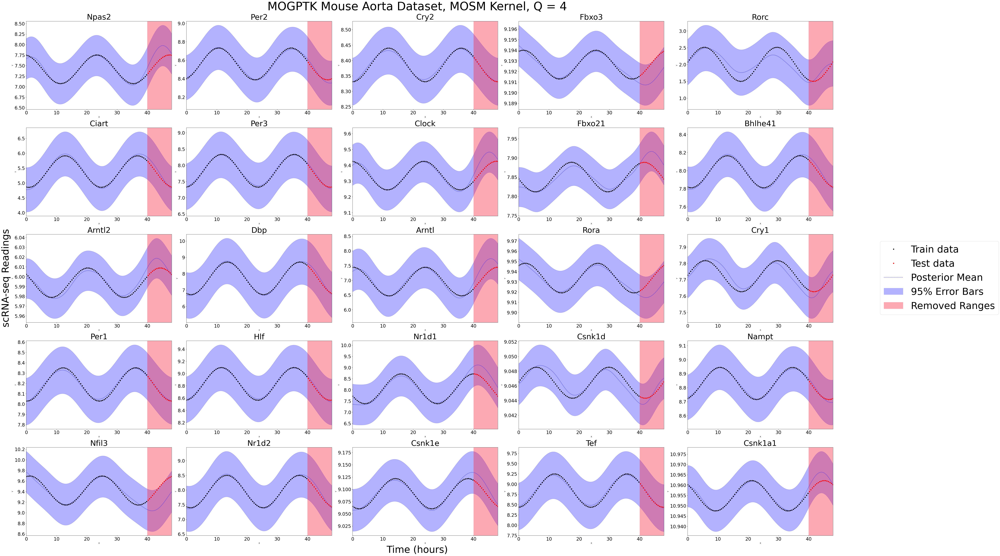

In [ ]:
suptitle = 'MOGPTK Mouse Aorta Dataset, MOSM Kernel, Q = 4'

plot_prediction(mogptk_model = mogptk_model,
                nrows = 5,
                ncols = 5,
                figsize = (60, 40),
                suptitle = suptitle,
                supfontsize=60,
                subfontsize= 40)

plt.savefig(os.path.join(plots_mouse_path, "mogptk_tempo2_q4_mosm.png"))
plt.show()

In [ ]:
mogptk_model.print_parameters()

Name,Range,Value
MultiOutputSpectralMixtureKernel.weight,"[1e-08, ∞)",[[3.26504845e+00 1.02329497e+00 7.63263974e-01 5.51581689e-01] [1.66035782e+00 5.46211215e-01 3.90893405e-01 2.84860037e-01] [5.36919670e-01 1.55116515e-01 1.17075700e-01 8.62851988e-02] [1.29452020e-02 3.12859238e-03 2.72750480e-03 2.04556267e-03] [4.21932470e+00 1.08155835e+00 7.87637814e-01 6.53691817e-01] [5.19190269e+00 1.34222139e+00 1.09527490e+00 8.15307186e-01] [4.94076426e+00 1.49271321e+00 1.10163677e+00 8.08580601e-01] [8.68531966e-01 2.66144120e-01 2.00605543e-01 1.45293963e-01] [3.25853632e-01 8.09422709e-02 5.94235325e-02 4.93822871e-02] [1.73386577e+00 4.27082681e-01 3.60103139e-01 2.68924479e-01] [1.32174655e-01 3.51847571e-02 2.54436836e-02 2.08606650e-02] [9.67917803e+00 2.26554714e+00 1.99111993e+00 1.49080769e+00] [4.70884673e+00 1.36271151e+00 1.06092342e+00 7.76685680e-01] [1.36753139e-01 2.94477703e-02 2.82905226e-02 2.11955161e-02] [7.94843840e-01 2.04806250e-01 1.49068779e-01 1.23481309e-01] [1.58633773e+00 4.47119689e-01 3.42877641e-01 2.53184532e-01] [2.61644257e+00 7.91846293e-01 5.83398724e-01 4.28092257e-01] [5.93123708e+00 1.29766778e+00 9.66052213e-01 8.19241571e-01] [1.76903198e-02 4.58026138e-03 3.33319313e-03 2.75912305e-03] [1.10576887e+00 3.60876854e-01 2.58874747e-01 1.88703322e-01] [2.64105667e+00 6.84403456e-01 5.62987508e-01 4.19553589e-01] [5.37499944e+00 1.28229811e+00 1.10824923e+00 8.28994906e-01] [2.94705914e-01 6.10701584e-02 5.98358093e-02 4.48284628e-02] [3.99112607e+00 1.16795564e+00 8.76364701e-01 6.45240865e-01] [6.66903991e-02 2.40507660e-02 1.71469247e-02 1.24369242e-02]]
MultiOutputSpectralMixtureKernel.mean,"[1e-08, 1.031250000000016]",[[[0.04529752] [0.01021106] [0.07020984] [0.09535831]] [[0.03845613] [0.0102067 ] [0.07579665] [0.09496736]] [[0.03830184] [0.01120839] [0.07611769] [0.0984394 ]] [[0.03536129] [0.00858139] [0.07129575] [0.09779037]] [[0.04845325] [0.08266496] [0.10144003] [0.11697371]] [[0.03858502] [0.00956422] [0.0765406 ] [0.09635667]] [[0.03837909] [0.01085285] [0.07613261] [0.09466095]] [[0.04526084] [0.01030958] [0.07013479] [0.09529994]] [[0.04146158] [0.07320072] [0.09414548] [0.11756551]] [[0.03855421] [0.00937807] [0.07629702] [0.09628098]] [[0.04435418] [0.0767484 ] [0.10670228] [0.1178205 ]] [[0.0385217 ] [0.00917271] [0.07639429] [0.09615212]] [[0.04511468] [0.01042824] [0.07032967] [0.09859597]] [[0.03520431] [0.00914993] [0.07162521] [0.09796547]] [[0.04714384] [0.08312921] [0.10267031] [0.11770061]] [[0.03832002] [0.0113173 ] [0.07615126] [0.09851531]] [[0.0383815 ] [0.01082197] [0.07613582] [0.09467366]] [[0.04118523] [0.07343589] [0.10567247] [0.13174829]] [[0.04721378] [0.08310929] [0.10206501] [0.11780644]] [[0.03843047] [0.01019647] [0.07597693] [0.09488064]] [[0.03540786] [0.00859143] [0.07131228] [0.0978731 ]] [[0.03852406] [0.00928023] [0.07631667] [0.09602303]] [[0.04121519] [0.00965258] [0.0764293 ] [0.09482336]] [[0.03832814] [0.01114207] [0.0761187 ] [0.0944887 ]] [[0.04436804] [0.01507576] [0.06706388] [0.09510909]]]
MultiOutputSpectralMixtureKernel.variance,"[1e-08, ∞)",[[[7.14457121e-05] [1.80767294e-05] [2.08582956e-05] [1.77632882e-05]] [[7.15929201e-05] [1.56043984e-05] [2.06018795e-05] [1.77606580e-05]] [[7.01778213e-05] [1.74861295e-05] [2.02061585e-05] [1.73352931e-05]] [[7.54918850e-05] [1.24347503e-05] [1.98475517e-05] [1.67104995e-05]] [[1.09998178e-04] [2.33594749e-05] [2.07958418e-05] [1.73632972e-05]] [[7.21180955e-05] [1.45109675e-05] [1.96277166e-05] [1.72551952e-05]] [[6.97404904e-05] [1.89716092e-05] [2.03238725e-05] [1.74715980e-05]] [[7.12592658e-05] [1.85352013e-05] [2.07569748e-05] [1.76591113e-05]] [[1.09152523e-04] [2.32020539e-05] [2.07530002e-05] [1.73420121e-05]] [[7.28815535e-05] [1.35598925e-05] [1.96021153e-05] [1.71543829e-05]] [[8.40304522e-05] [2.19946438e-05] [1.98675993e-05] [1.67452617e-05]] [[7.39934132e-05] [1.24764445e-05] [1.97751807e-05] [1.69569064e-05]] [[7.18645263e-05] [1.66034625e-05] [2.04394124e-05] [1.72473096

## MOGP Covariance Matrix

In [ ]:
# K = self.gpr.K(X).cpu().numpy()

# # normalise
# diag_sqrt = np.sqrt(np.diag(K))
# K /= np.outer(diag_sqrt, diag_sqrt)


output_dims = len(mogptk_model.dataset)
X_ = np.zeros((output_dims, 2))
X_[:,0] = np.arange(output_dims)
K = mogptk_model.gpr.K(X_).cpu().numpy()

# normalize
diag_sqrt = np.sqrt(np.diag(K))
K /= np.outer(diag_sqrt, diag_sqrt)

# Transform numpy array to dataframe
gene_cols = tempo_df.iloc[:, 1:].columns.tolist()
mogptk_covariance_df = pd.DataFrame(K, index = gene_cols, columns = gene_cols)

mogptk_covariance_df

,Npas2,Per2,Cry2,Fbxo3,Rorc,Ciart,Per3,Clock,Fbxo21,Bhlhe41,...,Per1,Hlf,Nr1d1,Csnk1d,Nampt,Nfil3,Nr1d2,Csnk1e,Tef,Csnk1a1
Npas2,1.000000,0.073389,0.033019,0.008093,0.246982,0.078743,0.047371,0.998441,0.097277,0.072560,...,0.032195,0.048671,0.213800,0.122749,0.072563,0.012149,0.070014,0.297960,0.034653,0.878245
Per2,0.073389,1.000000,0.928871,0.496055,0.001213,0.846808,0.956236,0.072707,0.037245,0.786484,...,0.916622,0.958091,0.286451,-0.000120,0.999715,0.505182,0.773404,0.503468,0.943258,0.088924
Cry2,0.033019,0.928871,1.000000,0.527585,0.001486,0.880432,0.981911,0.036180,0.122622,0.843807,...,0.997012,0.981013,0.351623,0.001864,0.929976,0.529501,0.836148,0.489139,0.987436,0.079362
Fbxo3,0.008093,0.496055,0.527585,1.000000,0.000039,0.442826,0.506743,0.009236,0.019894,0.429797,...,0.519112,0.506617,0.074563,0.000043,0.501025,0.997193,0.428942,0.095215,0.515973,0.006810
Rorc,0.246982,0.001213,0.001486,0.000039,1.000000,0.003523,0.001515,0.266417,0.102322,0.003834,...,0.001703,0.001503,0.074767,0.867544,0.001175,0.000033,0.003848,0.048339,0.001478,0.179880
Ciart,0.078743,0.846808,0.880432,0.442826,0.003523,1.000000,0.882956,0.078091,0.331921,0.991412,...,0.893916,0.882159,0.541870,0.008162,0.848609,0.434443,0.988530,0.636147,0.879169,0.104645
Per3,0.047371,0.956236,0.981911,0.506743,0.001515,0.882956,1.000000,0.050695,0.112418,0.844975,...,0.974990,0.999956,0.347890,0.001679,0.957251,0.509828,0.835319,0.512868,0.996493,0.088848
Clock,0.998441,0.072707,0.036180,0.009236,0.266417,0.078091,0.050695,1.000000,0.118331,0.072618,...,0.035256,0.051969,0.230599,0.157476,0.071818,0.013096,0.069986,0.308035,0.037721,0.882395
Fbxo21,0.097277,0.037245,0.122622,0.019894,0.102322,0.331921,0.112418,0.118331,1.000000,0.383995,...,0.153583,0.110045,0.882560,0.207773,0.037604,0.011104,0.391792,0.611871,0.115860,0.144305
Bhlhe41,0.072560,0.786484,0.843807,0.429797,0.003834,0.991412,0.844975,0.072618,0.383995,1.000000,...,0.861906,0.843710,0.573157,0.009651,0.788039,0.417749,0.999174,0.632916,0.841859,0.099808


<ipython-input-30-caf4c03aeed7>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, "mogptk_mosm_tempo2_heatmap.png"))
<ipython-input-30-caf4c03aeed7>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, "mogptk_mosm_tempo2_heatmap.png"))
<ipython-input-30-caf4c03aeed7>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, "mogptk_mosm_tempo2_heatmap.png"))
<ipython-input-30-caf4c03aeed7>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which

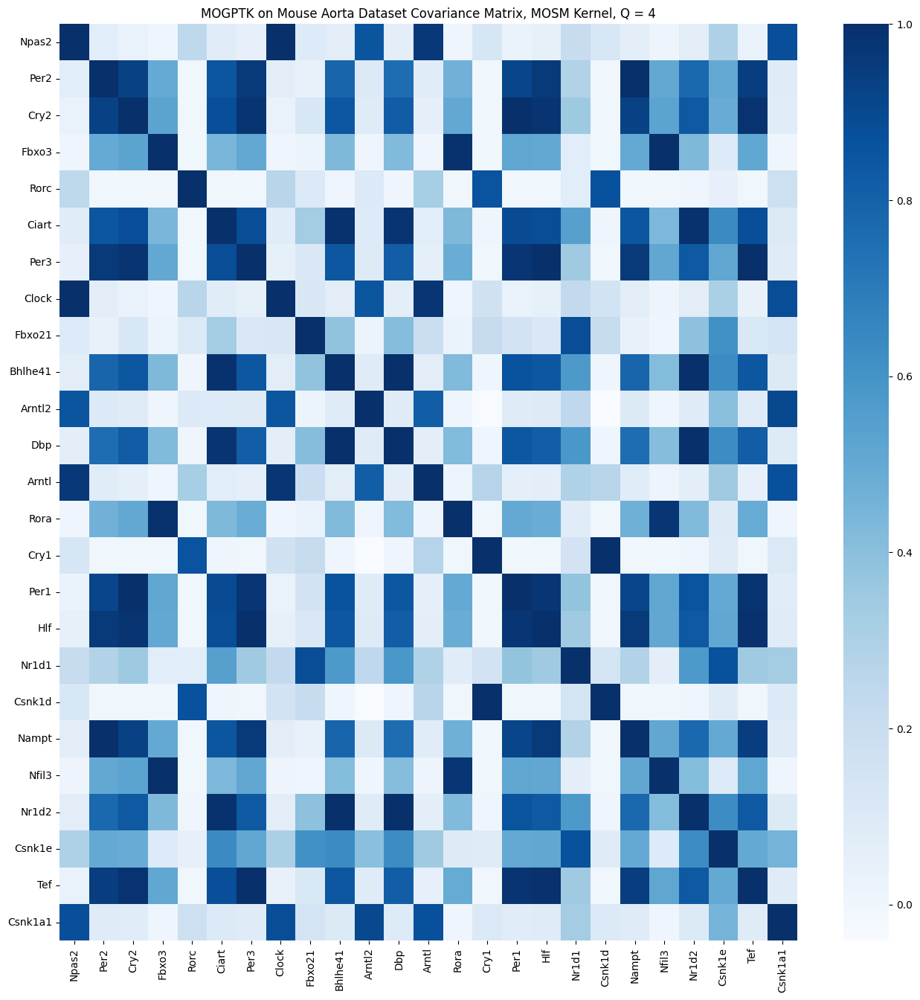

In [ ]:
plt.figure(figsize=(16,16))
sns.heatmap(mogptk_covariance_df, cmap = 'Blues', xticklabels=True, yticklabels=True)
plt.title('MOGPTK on Mouse Aorta Dataset Covariance Matrix, MOSM Kernel, Q = 4')
plt.savefig(os.path.join(plots_mouse_path, "mogptk_mosm_tempo2_heatmap.png"))


## Visualizing Weights and Magnitude

In [ ]:

input_dims = mogptk_model.dataset.get_input_dims()[0]
output_dims = mogptk_model.dataset.get_output_dims()
Q = mogptk_model.Q

cross_params = {}
cross_params['covariance'] = np.zeros((output_dims, output_dims, input_dims, Q))
cross_params['mean'] = np.zeros((output_dims, output_dims, input_dims, Q))
cross_params['magnitude'] = np.zeros((output_dims, output_dims, Q))
cross_params['delay'] = np.zeros((output_dims, output_dims, input_dims, Q))
cross_params['phase'] = np.zeros((output_dims, output_dims, Q))

weight = mogptk_model.gpr.kernel.weight.numpy()
mean = mogptk_model.gpr.kernel.mean.numpy()
variance = mogptk_model.gpr.kernel.variance.numpy()
phase = mogptk_model.gpr.kernel.phase.numpy()
delay = mogptk_model.gpr.kernel.delay.numpy()
for q in range(Q):
    for i in range(output_dims):
        for j in range(output_dims):
            w_i = weight[i,q]
            w_j = weight[j,q]
            mu_i = mean[i,q,:]
            mu_j = mean[j,q,:]
            var_i = variance[i,q,:]
            var_j = variance[j,q,:]
            sv = var_i + var_j

            cross_params['covariance'][i, j, :, q] = 2 * (var_i * var_j) / sv
            cross_mean_num = var_i.dot(mu_j) + var_j.dot(mu_i)
            cross_params['mean'][i, j, :, q] = cross_mean_num / sv
            exp_term = -1/4 * ((mu_i - mu_j)**2 / sv).sum()
            cross_params['magnitude'][i, j, q] = w_i * w_j * np.exp(exp_term)
            for k in range(input_dims):
                cross_params['delay'][i, j, k, q] = delay[i,q,k]-delay[j,q,k]
            cross_params['phase'][i, j, q] = phase[i,q]-phase[j,q]

<ipython-input-40-f95df9aceb53>:8: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, "mogptk_mosm_tempo2_magnitude.png"))
<ipython-input-40-f95df9aceb53>:8: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, "mogptk_mosm_tempo2_magnitude.png"))
<ipython-input-40-f95df9aceb53>:8: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, "mogptk_mosm_tempo2_magnitude.png"))
<ipython-input-40-f95df9aceb53>:8: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore"

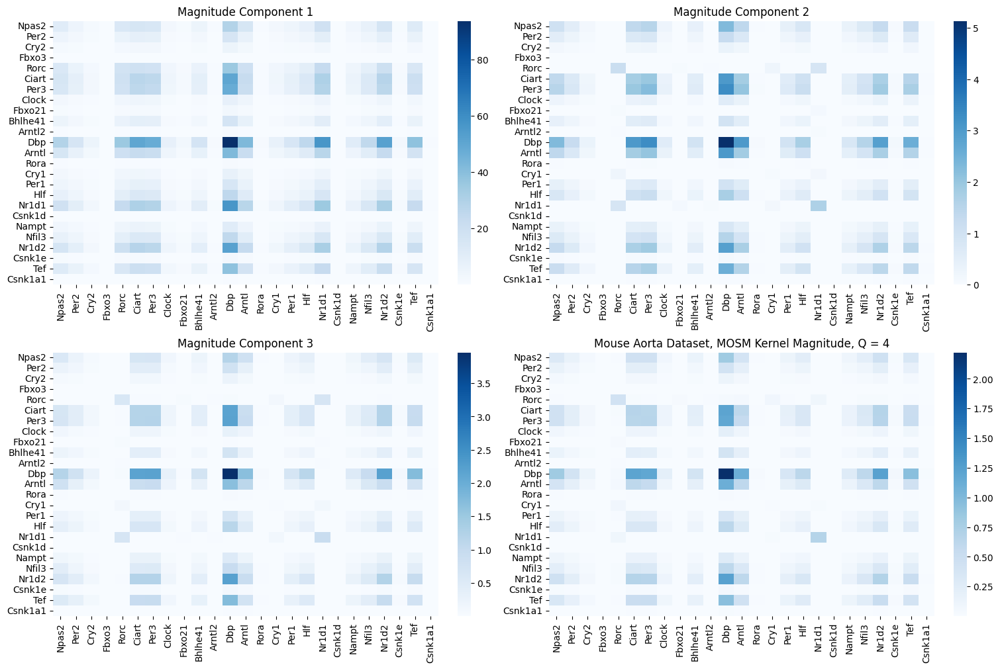

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(15, 10), layout = "constrained")
for i in range(Q):
  r, c = divmod(i, 2)
  sns.heatmap(pd.DataFrame(cross_params['magnitude'][:, :, i], columns=gene_cols, index=gene_cols), cmap = 'Blues', xticklabels=True, yticklabels=True, ax = ax[r, c])
  ax[r, c].set_title(f"Magnitude Component {i+1}")

plt.title("Mouse Aorta Dataset, MOSM Kernel Magnitude, Q = 4")
plt.savefig(os.path.join(plots_mouse_path, "mogptk_mosm_tempo2_magnitude.png"))

<ipython-input-39-7f6d96b355e5>:14: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, "mogptk_mosm_tempo2_weights.png"))
<ipython-input-39-7f6d96b355e5>:14: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, "mogptk_mosm_tempo2_weights.png"))
<ipython-input-39-7f6d96b355e5>:14: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, "mogptk_mosm_tempo2_weights.png"))
<ipython-input-39-7f6d96b355e5>:14: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" w

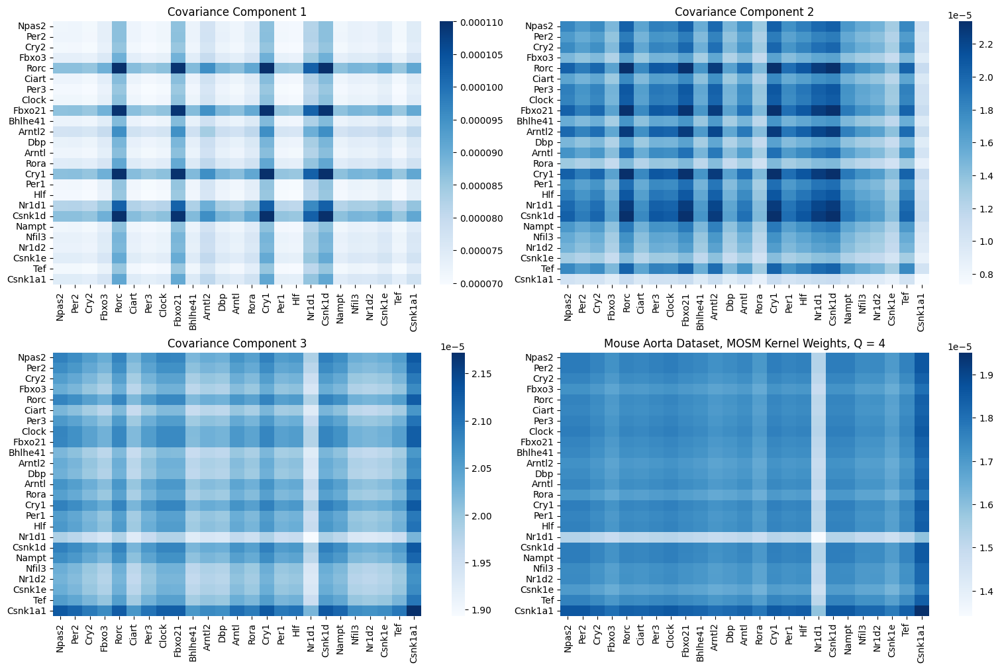

In [ ]:
weights = dict()

for i in range(Q):
  weights[i] = cross_params['covariance'][:, :, 0, i]


fig, ax = plt.subplots(2, 2, figsize=(15, 10), layout = "constrained")
for i in range(Q):
  r, c = divmod(i, 2)
  sns.heatmap(pd.DataFrame(weights[i], columns=gene_cols, index=gene_cols), cmap = 'Blues', xticklabels=True, yticklabels=True, ax = ax[r, c])
  ax[r, c].set_title(f"Covariance Component {i+1}")

plt.title("Mouse Aorta Dataset, MOSM Kernel Weights, Q = 4")
plt.savefig(os.path.join(plots_mouse_path, "mogptk_mosm_tempo2_weights.png"))

## MOGP Performance Metrics

In [ ]:
tempo_df.iloc[:, 1:]

,Gene_0,Gene_1,Gene_10,Gene_11,Gene_12,Gene_13,Gene_14,Gene_15,Gene_16,Gene_17,...,Gene_5,Gene_6,Gene_7,Gene_8,Gene_9,Gene_147,Gene_153,Gene_363,Gene_437,Gene_8842
0,-7.331950,-9.193044,-6.735561,-7.533443,-6.251909,-7.146333,-6.612689,-5.518543,-7.419914,-7.320285,...,-7.453991,-7.061559,-4.290994,-6.153361,-6.273248,-4.295130,-5.911972,-4.661528,-5.160299,-9.789940
1,-7.338539,-9.192457,-6.776823,-7.537013,-6.242598,-7.128991,-6.589190,-5.503401,-7.426308,-7.419993,...,-7.434821,-7.056396,-4.291231,-6.151723,-6.258422,-4.290454,-5.913850,-4.654036,-5.201591,-9.742721
2,-7.360411,-9.196095,-6.802790,-7.540078,-6.230734,-7.098331,-6.563524,-5.497039,-7.446659,-7.509534,...,-7.416061,-7.049926,-4.291519,-6.150507,-6.242694,-4.290662,-5.913323,-4.647959,-5.241974,-9.700050
3,-7.397214,-9.203899,-6.813045,-7.542588,-6.216507,-7.054846,-6.536105,-5.499560,-7.480639,-7.587467,...,-7.398012,-7.042252,-4.291852,-6.149733,-6.226316,-4.295751,-5.910400,-4.643395,-5.280798,-9.662615
4,-7.448355,-9.215745,-6.807421,-7.544503,-6.200146,-6.999236,-6.507374,-5.510923,-7.527701,-7.652537,...,-7.380965,-7.033500,-4.292226,-6.149414,-6.209551,-4.305639,-5.905126,-4.640417,-5.317439,-9.631019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,-7.456843,-9.236449,-6.434278,-7.515353,-6.261285,-7.080229,-6.678110,-5.660022,-7.532582,-6.853762,...,-7.528596,-7.067820,-4.290614,-6.163521,-6.319041,-4.360026,-5.881578,-4.702937,-4.999326,-10.008278
96,-7.403702,-9.219726,-6.527803,-7.520305,-6.263243,-7.116759,-6.666621,-5.613535,-7.484370,-6.976860,...,-7.510866,-7.068488,-4.290620,-6.160517,-6.310013,-4.337326,-5.892398,-4.691187,-5.037624,-9.951003
97,-7.364795,-9.206789,-6.610041,-7.525021,-6.262316,-7.140168,-6.651719,-5.574057,-7.449180,-7.096921,...,-7.492321,-7.067654,-4.290686,-6.157794,-6.299252,-4.318756,-5.901159,-4.680254,-5.077650,-9.894926
98,-7.340749,-9.197847,-6.679667,-7.529424,-6.258517,-7.150079,-6.633645,-5.542222,-7.427579,-7.212014,...,-7.473260,-7.065332,-4.290811,-6.155396,-6.286931,-4.304615,-5.907719,-4.670315,-5.118763,-9.840949


In [ ]:
mogptk_preds_df.iloc[:, 1:]

,Npas2,Per2,Cry2,Fbxo3,Rorc,Ciart,Per3,Clock,Fbxo21,Bhlhe41,...,Per1,Hlf,Nr1d1,Csnk1d,Nampt,Nfil3,Nr1d2,Csnk1e,Tef,Csnk1a1
0,7.661809,8.411136,8.331279,9.194442,2.074743,4.773656,7.340422,9.401447,7.824440,7.795338,...,8.023919,8.572582,7.356659,9.046230,8.731320,9.769196,7.367749,9.057324,8.455132,10.959446
1,7.684027,8.418649,8.332971,9.194328,2.113752,4.774884,7.358691,9.407609,7.824335,7.792523,...,8.028190,8.582393,7.345922,9.046404,8.736390,9.744053,7.359256,9.057342,8.468823,10.959378
2,7.698930,8.428305,8.335596,9.194207,2.157887,4.784302,7.383514,9.411860,7.823934,7.792290,...,8.035192,8.595668,7.338607,9.046610,8.742897,9.717781,7.358339,9.057665,8.487803,10.959149
3,7.705779,8.440043,8.339080,9.194081,2.205359,4.801601,7.414488,9.413997,7.823169,7.794597,...,8.044708,8.612198,7.333827,9.046841,8.750781,9.690947,7.364768,9.058292,8.511693,10.958760
4,7.704110,8.453782,8.343330,9.193955,2.254142,4.826442,7.451190,9.413883,7.822025,7.799401,...,8.056472,8.631758,7.330921,9.047091,8.759974,9.664006,7.378336,9.059222,8.540093,10.958221
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,7.955218,8.364180,8.339882,9.191616,1.966581,5.017846,7.355025,9.478679,7.904797,7.877591,...,8.061826,8.578588,8.529653,9.046110,8.703079,9.237996,7.625815,9.087665,8.480205,10.964691
96,7.926834,8.356524,8.336629,9.191802,1.994003,4.953983,7.321832,9.471844,7.899470,7.855222,...,8.051065,8.561099,8.426440,9.046403,8.697871,9.277272,7.554616,9.082542,8.454607,10.963809
97,7.888204,8.352059,8.334020,9.191992,2.013616,4.897325,7.296783,9.462218,7.893602,7.835062,...,8.042201,8.547948,8.320416,9.046657,8.694716,9.317061,7.490158,9.077658,8.435078,10.962773
98,7.840528,8.350814,8.332121,9.192182,2.026311,4.849036,7.280407,9.450102,7.887401,7.817514,...,8.035448,8.539413,8.212893,9.046867,8.693647,9.356466,7.433866,9.073101,8.422083,10.961610


### Pooled MSE

In [ ]:
mogptk_pooled_mse = pooled_mse(pred_df = mogptk_preds_df.iloc[:, 1:],
                                true_df = tempo_df.iloc[:, 1:])

### R2

In [ ]:
mogptk_r2 = r2_score(y_true = tempo_df.iloc[:, 1:], y_pred = mogptk_preds_df.iloc[:, 1:])

In [ ]:
print(f"The Pooled MSE of the MOGPTK Model is {mogptk_pooled_mse}.")
print(f"The R^2 of the MOGPTK Model is {mogptk_r2}.")

The Pooled MSE of the MOGPTK Model is 0.005908408208080077.
The R^2 of the MOGPTK Model is 0.8504093992228253.


# NCDE (Noise-Perturbed)

## NCDE Configs

In [ ]:
# Data params
N_SNAPSHOTS = 5000 # number of observations
N_TIMEPOINTS = tempo_df.shape[0] # number of datapoints

# Model params
HIDDEN_SIZE = 48
WIDTH_SIZE = 32 # The size of each hidden layer.
OUTPUT_SIZE = tempo_df.shape[1] - 1 # output size, which here is the number of genes we want to output. # features = # genes = # columns in waves_df - 1 (because of time column)
DEPTH = 12
SEED = 12314
KEY = jr.PRNGKey(SEED)
train_data_key, test_data_key, model_key, loader_key = jr.split(KEY, 4)

add_noise = False
BATCH_SIZE = 32
lr = 1e-2
steps = 800

# Suppose we have lag-p auto-regressors
WINDOW_LENGTH = 4000
STEPSIZE = 10
NCDE_TRAIN_HIST_PROP = 0.8

## Helper Functions + Specify Model

In [ ]:
# First, define the function which will specify the vector field of
# the differential equation.
class Func(eqx.Module):
    mlp: eqx.nn.MLP
    data_size: int
    hidden_size: int

    def __init__(self, data_size, hidden_size, width_size, depth, *, key, **kwargs):
        super().__init__(**kwargs)
        self.data_size = data_size
        self.hidden_size = hidden_size
        self.mlp = eqx.nn.MLP(
            hidden_size,
            hidden_size * data_size,
            width_size,
            depth,
            activation=jnn.tanh,
            # Note the use of a tanh final activation function. This is important to
            # stop the model blowing up. (Just like how GRUs and LSTMs constrain the
            # rate of change of their hidden states.)
            final_activation=jnn.tanh,
            key=key,
        )

    def __call__(self, t, y, args):
        return self.mlp(y).reshape(self.hidden_size, self.data_size)

# The above Func will be solved as part of the NeuralCDE algo
# Below. Note we do have an MLP for the initial condition
# As well as the future iterations.

class NeuralCDE(eqx.Module):
    initial: eqx.nn.MLP
    func: Func
    linear: eqx.nn.Linear

    def __init__(self, data_size, hidden_size, width_size, output_size, depth, *, key, **kwargs):
        super().__init__(**kwargs)
        ikey, fkey, lkey = jr.split(key, 3)
        self.initial = eqx.nn.MLP(in_size = data_size,
                                  out_size = hidden_size,
                                  width_size = width_size,
                                  depth = depth,
                                  key = ikey)
        self.func = Func(data_size, hidden_size, width_size, depth, key=fkey)
        self.linear = eqx.nn.Linear(hidden_size, output_size, key=lkey)

    def __call__(self, ts, coeffs, evolving_out=False):
        # Each sample of data consists of some timestamps `ts`, and some `coeffs`
        # parameterising a control path. These are used to produce a continuous-time
        # input path `control`.
        control = diffrax.CubicInterpolation(ts, coeffs) # X term
        print(f"Finished control with {control}")
        term = diffrax.ControlTerm(self.func, control).to_ode() # dXt term in NCDE
        solver = diffrax.Tsit5()
        dt0 = None
        y0 = self.initial(control.evaluate(ts[0]))

        print(f"ts[0] shape: {ts[0].shape}")
        print(f"y0 shape: {y0.shape}")

        if evolving_out:
            saveat = diffrax.SaveAt(ts=ts)
        else:
            saveat = diffrax.SaveAt(t1=True)
        solution = diffrax.diffeqsolve(
            term,
            solver,
            ts[0],
            ts[-1],
            dt0,
            y0,
            stepsize_controller=diffrax.PIDController(rtol=1e-3, atol=1e-6),
            saveat=saveat,
        )

        # return solution.ys, y0
        if evolving_out:
            # applies self.linear to every value of y (meaning at every timepoint)
            prediction = jax.vmap(lambda y: self.linear(y))(solution.ys) # jax.vmap(lambda y: jnn.tanh(self.linear(y)[0])(solution.ys)
        else:
            # print(f"solution.ys has shape {solution.ys.shape}")
            prediction = self.linear(solution.ys[-1]) # jnn.tanh(self.linear(solution.ys[-1])) # (prediction, )
        return prediction

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size

def window_stack(df, width=3, stepsize=1):
    """
    Takes in waves_df (T, G) dimension (T = # timepoints, G = # genes)
    and slides a window of length width (W), sliding over on stepsize at a time,
    to return two datasets:

    1. Jax array of feature vectors, size (T - W, G, W)
    2. Jax array of target vectors, size (T - W, G, 1)
    """

    dat = df.drop(labels = 'time', axis = 1) # remove time column
    dat = dat.T # transpose from [time, genes] to [genes, time]
    dat = dat.values # only gets values, which will make us lose gene index
    max_T = dat.shape[1] # number of timepoints
    range_T = df.time.to_list() # store all timepoints in a list

    # Create windowed Jax array for features (technically autoregressors)
    feat_window_list = [dat[:, k: (k + width)] for k in range(0, max_T - width, stepsize)]
    feat_window_jnp = jnp.array(feat_window_list) # turns this into a Jax array of size [T - W, G, W]
    feat_window_jnp = jnp.moveaxis(feat_window_jnp, -1, -2) # transposes last two axis so we get [T - W, W, G]

    # Prep timepoints to be stacked with the features, as this is a requirement for the diffrax training method
    time_window_jnp = jnp.array([range_T[k:k + width] for k in range(0, max_T - width, stepsize)]) # size [T - W, W]
    time_windowed = jnp.expand_dims(time_window_jnp, -1) # to [T - W, W, 1]

    # Concatenate (T - W, W, G) tensor of features with (T - W, W, 1) tensor of time to get a (T - W, W, G + 1) tensor of features + time
    x_windowed = jnp.concatenate([time_windowed, feat_window_jnp], axis = -1)

    # Create windowed Jax array for target (= response) variables
    target_window_list = [dat[:, k + width] for k in range(0, max_T - width, stepsize)]
    target_window_jnp = jnp.array(target_window_list) # turns into a Jax array of size [T - W, G]
    y_windowed = jnp.expand_dims(target_window_jnp, -2) # makes it same dimensionality as feat_window_jnp, i.e., [T - W, G] to [T - W, 1, G]

    return x_windowed, y_windowed, time_windowed

# Modeling Functions
def train_test_split(X, y, t, pct_hist):
    max_T = X.shape[0]
    hist_cutoff = int(max_T * pct_hist)

    X_hist, y_hist, t_hist = X[:hist_cutoff, :, :], y[:hist_cutoff, :, :], t[:hist_cutoff, :, :]
    X_future, y_future, t_future = X[hist_cutoff:, :, :], y[hist_cutoff:, :, :], t[hist_cutoff:, :, :]

    return X_hist, y_hist, t_hist, X_future, y_future, t_future


def cubic_spline_interpolation(X_stack, t_stack):
    # Do cubic spline interpolation to get X
    if t_stack.ndim == 3:
        t_stack = t_stack[:, :, 0]

    coeffs = jax.vmap(diffrax.backward_hermite_coefficients)(t_stack, X_stack)

    return coeffs

## Data Transformations for Training

In [ ]:
tempo_noise_iter = []

for i in range(N_SNAPSHOTS):
  tempo_wo_time = tempo_df.iloc[:, 1:] # shape :  (n_timepoints, n_genes)
  noise = np.random.normal(0, 0.001, tempo_wo_time.shape)
  tempo_wo_time = tempo_wo_time + noise # (n_timepoints, n_genes + 1)

  tempo_noise_iter.append(tempo_wo_time)

tempo_noise_iter = np.stack(tempo_noise_iter) # (n_shapshots, n_timepoints, n_genes + 1)

tempo_noise_iter.shape

(5000, 100, 25)

In [ ]:
# Get a 1D vector of timepoints from the dataset
t_vec = tempo_df['time'].values.reshape(-1, 1)
print(f"Shape of t_vec: {t_vec.shape}")
# repeat over N_SNAPSHOTS rows to prep for the NCDE training format
t_mat = np.tile(t_vec, (N_SNAPSHOTS, 1, 1))
print(f"Shape of t_mat: {t_mat.shape}")
# Prep it for training by removing the third dimension and remove last timepoint to fit training X_waveforms later
t_mat2d = t_mat[:, :N_TIMEPOINTS - 1, 0]
print(f"Shape of the t_mat2d is currently {t_mat2d.shape}.")

# Concatenate training data with timestamps to create waveforms_all
waveforms_all = jnp.concatenate([t_mat, tempo_noise_iter], axis = -1)
print(f"Shape of the waveforms_all is currently {waveforms_all.shape}")

# Split data into X and y
X_waveforms = waveforms_all[:, :N_TIMEPOINTS - 1, :]
y_waveforms = tempo_noise_iter[:, N_TIMEPOINTS - 1:, :]
y_waveforms_evol = tempo_noise_iter[:, :N_TIMEPOINTS - 1, :]
print(f"Created X_waveforms with shape {X_waveforms.shape} and y_waveforms with shape {y_waveforms.shape}.")

# Create cubic spline over X
coeffs = cubic_spline_interpolation(X_waveforms, t_mat2d)
print(f"Length of the coefficients is currently {len(coeffs)} with each element having shape {coeffs[0].shape}.")


Shape of t_vec: (100, 1)
Shape of t_mat: (5000, 100, 1)
Shape of the t_mat2d is currently (5000, 99).
Shape of the waveforms_all is currently (5000, 100, 26)
Created X_waveforms with shape (5000, 99, 26) and y_waveforms with shape (5000, 1, 25).
Length of the coefficients is currently 4 with each element having shape (5000, 98, 26).


## Train NCDE Model

### Run: 4/13/2025 7:04 PM, 500 steps, Depth = 4 (2x)

$$K_{ij}(\hat{x}) = \sum_{q = i}^{Q} \alpha_{ij}^{(q)} \mathcal{N}(-\phi_{ij}^{(q)}, \Sigma_{ij}^{(q)}) \text{cos}\left [ \left ( \hat{x} + \theta_{ij}^{(q)} \right )^{\intercal} \mu_{ij}^{(q)} + \phi_{ij}^{(q)} \right ]$$

Finished control with CubicInterpolation(
  ts=f32[99], coeffs=[f32[98,26], f32[98,26], f32[98,26], f32[98,26]]
)
ts[0] shape: ()
y0 shape: (48,)
y_true: (32, 99, 25); y_pred: (32, 99, 25).
Step: 0, Loss: 74.69225311279297, Accuracy: 74.69225311279297, Computation time: 15.07533884048462
Step: 1, Loss: 74.21217346191406, Accuracy: 74.21217346191406, Computation time: 0.7626819610595703
Step: 2, Loss: 73.73714447021484, Accuracy: 73.73714447021484, Computation time: 0.8134770393371582
Step: 3, Loss: 73.27225494384766, Accuracy: 73.27225494384766, Computation time: 0.7938752174377441
Step: 4, Loss: 72.81403350830078, Accuracy: 72.81403350830078, Computation time: 0.6765918731689453
Step: 5, Loss: 72.35549926757812, Accuracy: 72.35549926757812, Computation time: 0.7041096687316895
Step: 6, Loss: 71.89884948730469, Accuracy: 71.89884948730469, Computation time: 0.7438032627105713
Step: 7, Loss: 71.454833984375, Accuracy: 71.454833984375, Computation time: 0.8081512451171875
Step: 8, Loss: 

<ipython-input-48-30052754880c>:126: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, 'neural_tempo2_cde.png'))
<ipython-input-48-30052754880c>:126: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, 'neural_tempo2_cde.png'))
<ipython-input-48-30052754880c>:126: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, 'neural_tempo2_cde.png'))
<ipython-input-48-30052754880c>:126: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer suppo

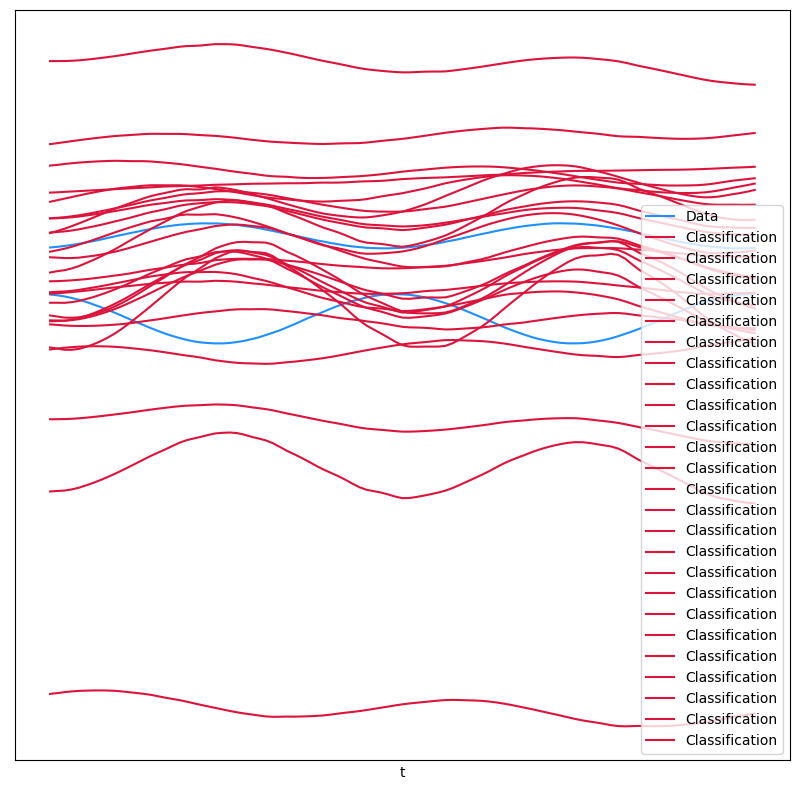

In [ ]:
# Training loop like normal.
### Model Instantiation ###
# NeuralCDEV2 is a class that takes in an (N, T - 1, G) tensor and the network architecture params.
# When instantiated (as done below)
model_sim = NeuralCDE(data_size = X_waveforms.shape[-1],
                      hidden_size = HIDDEN_SIZE,
                      width_size = WIDTH_SIZE,
                      output_size = OUTPUT_SIZE,
                      depth = DEPTH,
                      key = model_key)

### FUNCTIONS ###
def ncde_predict(model, ti, coeff_i, evolving_out = False):
    if evolving_out:
        def model_evolving(ts, coeffs):
            return model(ts, coeffs, evolving_out = True)
        return jax.vmap(model_evolving)(ti, coeff_i)
    else:
        return jax.vmap(model)(ti, coeff_i)

def compute_mse(y_true, y_pred, epsilon=1e-15):
    """
    MSE Loss for forecasting with real numbers
    """
    # if y_true.ndim == 3:
    #     y_true = y_true[:, 0, :]

    # Ensure predictions are clipped to avoid log(0)
    # y_pred = jnp.clip(y_pred, epsilon, 1 - epsilon)

    # Calculate the categorical cross-entropy
    # loss = jnp.mean(optax.l2_loss(y_pred, y_true))
    loss = jnp.mean((y_true - y_pred)**2, axis=1)

    # Return the mean loss over all samples
    return jnp.mean(loss)

@eqx.filter_jit
def loss(model, ti, y_true, coeff_i, evolving_out = False):
    pred = ncde_predict(model, ti, coeff_i, evolving_out = evolving_out)

    print(f"y_true: {y_true.shape}; y_pred: {pred.shape}.")

    # MSE
    mse_val = compute_mse(y_true = y_true, y_pred = pred)

    # mse_val = jnp.mean(mse_val)

    return mse_val, mse_val

# has_aux true will return two values: output to be differentiated and its gradient
grad_loss = eqx.filter_value_and_grad(loss, has_aux=True)

@eqx.filter_jit
def make_step(model, data_i, opt_state):
    ti, label_i, label_all_i, *coeff_i = data_i

    (mse_val, _), grads = grad_loss(model, ti, label_all_i, coeff_i, evolving_out = True)
    updates, opt_state = optim.update(grads, opt_state)
    model = eqx.apply_updates(model, updates)
    return mse_val, model, opt_state

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size


### EXECUTION ###
# Optional section
optim = optax.adam(1e-4)
opt_state = optim.init(eqx.filter(model_sim, eqx.is_inexact_array))
for step, data_i in zip(
    range(steps), dataloader((t_mat2d, y_waveforms, y_waveforms_evol) + coeffs, BATCH_SIZE, key=loader_key)
):
    start = time.time()
    mse_val, model_sim, opt_state = make_step(model_sim, data_i, opt_state)
    end = time.time()
    print(
        f"Step: {step}, Loss: {mse_val}, Accuracy: {mse_val}, Computation time: "
        f"{end - start}"
    )

# ts, coeffs, labels, _ = get_data(dataset_size, add_noise, key=test_data_key)
(mse_val, _) = loss(model = model_sim,
                    ti = t_mat2d,
                    y_true = y_waveforms,
                    coeff_i = coeffs)
print(f"Test loss: {mse_val}, Test Accuracy: {mse_val}")

# Plot results : Data Preparation for Plotting
sample_ts = t_mat2d[-1] # gets the last waveform in the dataset [size: (N_TIMEPOINTS - 1,)]
# coeffs is a list of four tensors for each cubic spliene coefficient,
# so we get, for each coefficient tensor, the last row which is the coefficients of the last tensor
sample_coeffs = tuple(c[-1] for c in coeffs)
# Get predictions for that waveform
pred = model_sim(sample_ts, sample_coeffs, evolving_out=True)
# This interpolates data for the coefficients
interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# Evaluates sample time series for the actual values
values = jax.vmap(interp.evaluate)(sample_ts)

fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1)

ax1.plot(sample_ts, values[:, 1], c="dodgerblue")
ax1.plot(sample_ts, values[:, 2], c="dodgerblue", label="Data")
ax1.plot(sample_ts, pred, c="crimson", label="Classification")
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlabel("t")
ax1.legend()

plt.tight_layout()
plt.savefig(os.path.join(plots_mouse_path, 'neural_tempo2_cde.png'))
plt.show()

## Plot Predictions

Finished control with CubicInterpolation(
  ts=f64[99](numpy), coeffs=(f32[98,26], f32[98,26], f32[98,26], f32[98,26])
)
ts[0] shape: ()
y0 shape: (48,)


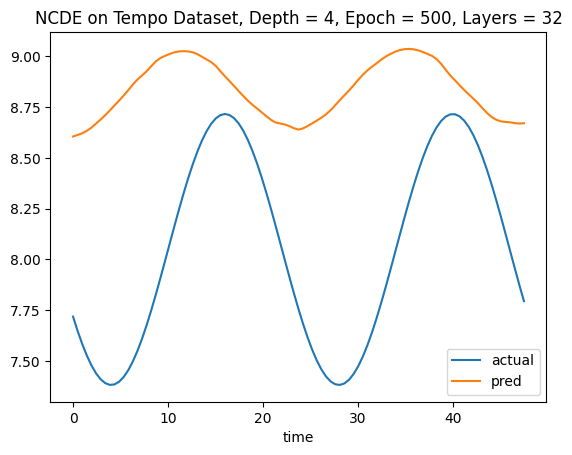

In [ ]:
ncde_pred_df = model_sim(sample_ts, sample_coeffs, evolving_out=True)

# # This interpolates data for the coefficients
# sample_interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# # Evaluate sample time series for the actual values
# sample_values = jax.vmap(sample_interp.evaluate)(sample_ts)

samp_idx = 17
colname = tempo_df.iloc[:, 1:].columns.tolist()[samp_idx]

actual_data = tempo_df.iloc[:-1, :].loc[:, colname].values
pred_data = ncde_pred_df[:, samp_idx - 1]

sample_pred_df = pd.DataFrame({'t': sample_ts, 'actual': actual_data, 'pred': pred_data})
sample_pred_df = sample_pred_df.sort_values(by = 't', ascending = True)

# Plot
sample_pred_df.plot(x = 't')
plt.xlabel('time')
plt.title('NCDE on Tempo Dataset, Depth = 4, Epoch = 500, Layers = 32')
plt.show()

In [ ]:
gene_cols = tempo_df.iloc[:, 1:].columns.tolist()

ncde_pred_df = model_sim(sample_ts, sample_coeffs, evolving_out=True)
ncde_pred_df = pd.DataFrame(ncde_pred_df, columns = gene_cols)

# # This interpolates data for the coefficients
# sample_interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# # Evaluate sample time series for the actual values
# sample_values = jax.vmap(sample_interp.evaluate)(sample_ts)

fig, ax = plt.subplots(5, 5, figsize = (60, 40), layout = "constrained")

for col in range(ncde_pred_df.shape[1]):
  r, c = divmod(col, 5)

  colname = gene_cols[col]

  actual_data = tempo_df.iloc[:-1, :].loc[:, colname].values
  pred_data = ncde_pred_df[colname].values

  sample_pred_df = pd.DataFrame({'t': sample_ts, 'actual': actual_data, 'pred': pred_data})
  sample_pred_df = sample_pred_df.sort_values(by = 't', ascending = True)

  ax[r, c].plot(sample_pred_df['t'].values,
                sample_pred_df['actual'].values,
                label = 'actual',
                color = 'black')
  ax[r, c].plot(sample_pred_df['t'].values,
                sample_pred_df['pred'].values,
                label = 'pred',
                color = 'blue')
  ax[r, c].set_title(colname, fontsize = 40)
  ax[r, c].tick_params(axis='both', which='major', labelsize=24)
  ax[r, c].tick_params(axis='both', which='minor', labelsize=20)

fig.supxlabel('Time (hours)', fontsize = 50)
fig.supylabel('scRNA-seq Readings', fontsize = 50)

handles, labels = ax[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize= 50)

suptitle_ncde = 'NCDE on Tempo Dataset, Depth = 4, Epoch = 500, Layers = 32'
plt.suptitle(suptitle_ncde, fontsize = 60)
plt.savefig(os.path.join(plots_mouse_path, 'ncde_tempo2_d4_ep500_l32.png'))
plt.show()

## Performance Metrics

### Pooled MSE

In [ ]:
ncde_pooled_mse = pooled_mse(ncde_pred_df, tempo_df.iloc[:-1, 1:])

### R2

In [ ]:
ncde_r2 = r2_score(y_true = tempo_df.iloc[:-1, 1:], y_pred = ncde_pred_df)

In [ ]:
print(f"Pooled MSE: {ncde_pooled_mse}")
print(f"R2: {ncde_r2}")

Pooled MSE: 0.03298377978635499
R2: -790.8349492676224


# Koopman

## Koopman Configs

In [ ]:
# Data params
N_SNAPSHOTS = 1000 # number of observations
N_TIMEPOINTS = tempo_df.shape[0] # number of datapoints
DT = 1
X0_koop = tempo_df.iloc[0, 1:].values # gets first row (0) and all columns except time (1:)
time_vec = tempo_df['time'].values

In [ ]:
X0_koop.shape

(25,)

## Data Transformations for Training

In [ ]:
tempo_noise_iter = []

X_edmds = []
Y_edmds = []

for i in range(N_SNAPSHOTS):
  # Get all waveforms without the time column
  tempo_wo_time = tempo_df.iloc[:, 1:] # shape :  (n_timepoints, n_genes)

  # Add noise
  noise = np.random.normal(0, 0.01, tempo_wo_time.shape)
  tempo_wo_time = tempo_wo_time + noise # (n_timepoints, n_genes)

  # Shape: (n_timepoints - 1, n_genes)
  X_edmd = tempo_wo_time.iloc[:-1, :]
  Y_edmd = tempo_wo_time.iloc[1:, :]

  X_edmds.append(X_edmd)
  Y_edmds.append(Y_edmd)

# Shape: ((n_timepoints - 1) * N_SNAPSHOTS, n_genes)
X_edmds = np.vstack(X_edmds)
Y_edmds = np.vstack(Y_edmds)

Xkoop_test = tempo_df.iloc[:, 1:].values

  # dinner_noise_iter.append(dinner_wo_time)

# dinner_noise_iter = np.concatenate(dinner_noise_iter, axis = 0) # (n_shapshots * n_timepoints, n_genes)

In [ ]:
Y_edmds.shape

(99000, 25)

In [ ]:
Xtest = tempo_df.iloc[:, 1:].values
Xtest.shape

(100, 25)

## Koopman Training

### EDMD Fit

In [ ]:
## Training
regr = pk.regression.EDMD()
obsv = pk.observables.Polynomial(degree=2)

model_edmd = pk.Koopman(observables=obsv, regressor=regr)


In [ ]:
# Takes a lot of RAM to run
model_edmd.fit(X_edmds, y=Y_edmds, dt=DT)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The attribute `n_input_features_` was deprecated in version 1.0 and will be removed in 1.2.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The attribute `n_input_features_` was deprecated in version 1.0 and will be removed in 1.2.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The attribute `n_input_features_` was deprecated in version 1.0 and will be removed in 1.2.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The attribute `n_input_features_` was deprecated in version 1.0 and will be removed in 1.2.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The att

Koopman(observables=Polynomial(), regressor=EDMD())

### DMD Fit

In [ ]:
tempo_df.head()

,time,Npas2,Per2,Cry2,Fbxo3,Rorc,Ciart,Per3,Clock,Fbxo21,...,Per1,Hlf,Nr1d1,Csnk1d,Nampt,Nfil3,Nr1d2,Csnk1e,Tef,Csnk1a1
0,0.000000,7.748220,8.399048,8.331121,9.193899,2.073665,4.865835,7.330227,9.424263,7.845094,...,8.029243,8.567511,7.718639,9.046535,8.722518,9.684439,7.429942,9.064943,8.437274,10.960244
1,0.484848,7.737764,8.408289,8.331713,9.193955,2.136715,4.856487,7.341687,9.422155,7.840329,...,8.029931,8.573825,7.647963,9.046801,8.728349,9.691761,7.410793,9.063074,8.442865,10.959572
2,0.969697,7.722093,8.419966,8.333171,9.193990,2.197673,4.855644,7.361011,9.418639,7.835724,...,8.033195,8.584293,7.583739,9.047062,8.735818,9.694723,7.400305,9.061656,8.454886,10.958823
3,1.454545,7.701457,8.433894,8.335473,9.194004,2.255559,4.863321,7.387887,9.413772,7.831353,...,8.038982,8.598745,7.526998,9.047312,8.744806,9.693278,7.398648,9.060711,8.473146,10.958011
4,1.939394,7.676190,8.449848,8.338581,9.193996,2.309441,4.879394,7.421883,9.407632,7.827287,...,8.047199,8.616949,7.478654,9.047548,8.755168,9.687448,7.405848,9.060254,8.497349,10.957147


In [ ]:
dmd = DMD(svd_rank=25)

model_dmd = pk.Koopman(regressor=dmd)
model_dmd.fit(X_edmd.values, Y_edmd.values)
model_dmd.time['dt']=time_vec[1] - time_vec[0]

### DMD Simulate (Predict)

In [ ]:
koopman_pred_df = model_dmd.simulate(x0 = X0_koop, n_steps = len(time_vec))
koopman_pred_df = pd.DataFrame(koopman_pred_df, columns = tempo_df.iloc[:, 1:].columns.tolist())

/usr/local/lib/python3.11/dist-packages/pykoopman/koopman.py:292: ComplexWarning: Casting complex values to real discards the imaginary part
  x = x.astype(self.A.dtype)


In [ ]:
koopman_pred_df.shape

(100, 25)

## Plot DMD Simulation

<ipython-input-31-c12358571f2e>:38: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, 'dmd_tempo2_r25.png'))
<ipython-input-31-c12358571f2e>:38: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, 'dmd_tempo2_r25.png'))
<ipython-input-31-c12358571f2e>:38: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, 'dmd_tempo2_r25.png'))
<ipython-input-31-c12358571f2e>:38: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer supported as of 3.

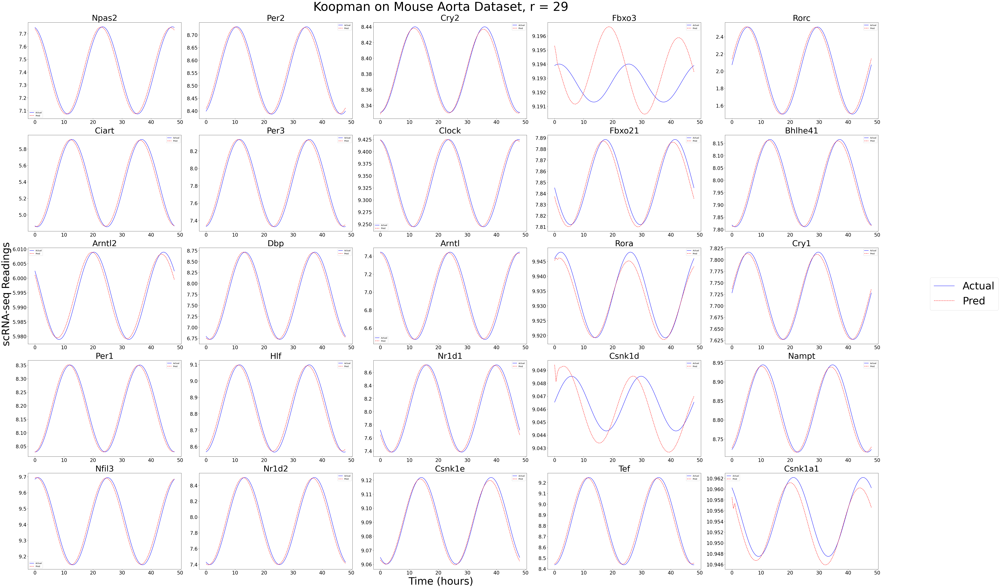

In [ ]:
fig, axs = plt.subplots(5, 5,
                        figsize=(60, 40),
                        layout = "constrained")

Xmin = min(Xkoop_test.shape[0], koopman_pred_df.shape[0])

gene_cols = tempo_df.iloc[:, 1:].columns.tolist()

for col in range(koopman_pred_df.shape[1]):
  r, c = divmod(col, 5)

  colname = gene_cols[col]

  axs[r, c].plot(time_vec[:Xmin],
                 Xkoop_test[:Xmin, col],
                 '-',
                 color='b',
                 label='Actual')
  axs[r, c].plot(time_vec[:Xmin],
                 koopman_pred_df.iloc[:Xmin, :].loc[:, colname].values,
                 '--r',
                 label='Pred')
  axs[r, c].legend()
  axs[r, c].set_title(colname, fontsize = 40)
  axs[r, c].tick_params(axis='both', which='major', labelsize=24)
  axs[r, c].tick_params(axis='both', which='minor', labelsize=20)


# Plot
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize= 50)

fig.supxlabel('Time (hours)', fontsize = 50)
fig.supylabel('scRNA-seq Readings', fontsize = 50)

suptitle_koop = 'Koopman on Mouse Aorta Dataset, r = 29'
plt.suptitle(suptitle_koop, fontsize = 60)
plt.savefig(os.path.join(plots_mouse_path, 'dmd_tempo2_r25.png'))
plt.show()

In [ ]:
koopman_pred_df.iloc[:Xmin, 0]

,Npas2
0,7.739036
1,7.722062
2,7.700858
3,7.674977
4,7.644913
...,...
95,7.742251
96,7.746784
97,7.745912
98,7.739649


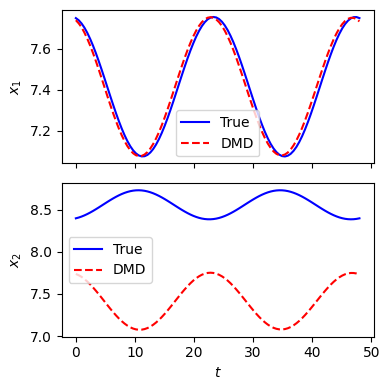

In [ ]:
fig, axs = plt.subplots(2, 1, sharex=True, tight_layout=True, figsize=(4, 4))

Xmin = min(Xkoop_test.shape[0], koopman_pred_df.shape[0])

axs[0].plot(time_vec[:Xmin], Xkoop_test[:Xmin, 0], '-', color='b', label='True')
axs[0].plot(time_vec[:Xmin], koopman_pred_df.iloc[:Xmin, 0].values, '--r', label='DMD')
axs[0].set(ylabel=r'$x_1$')
axs[1].plot(time_vec[:Xmin], Xkoop_test[:Xmin, 1], '-', color='b', label='True')
axs[1].plot(time_vec[:Xmin], koopman_pred_df.iloc[:Xmin, 0].values, '--r', label='DMD')
axs[1].set(
        ylabel=r'$x_2$',
        xlabel=r'$t$')
for i in range(2):
    axs[i].legend(loc='best')

## Eigenvectors

In [ ]:
koop_lv_eigenvals = np.log(np.linalg.eig(model_dmd.A)[0])/DT

print(f"koopman eigenvalues = {koop_lv_eigenvals}")

koopman eigenvalues = [-1.63865396e-06+0.j         -2.18928527e-04+0.12712733j
 -2.18928527e-04-0.12712733j -8.52788750e-01+0.57005033j
 -8.52788750e-01-0.57005033j -1.42699853e+00+0.31934931j
 -1.42699853e+00-0.31934931j -8.63526886e-01+1.62506354j
 -8.63526886e-01-1.62506354j -1.06603522e+00+1.38883626j
 -1.06603522e+00-1.38883626j -9.40930083e-01+1.80415879j
 -9.40930083e-01-1.80415879j -9.36506473e-01+2.06680395j
 -9.36506473e-01-2.06680395j -7.67230374e-01+3.14159265j
 -1.68645323e+00+1.44933824j -1.68645323e+00-1.44933824j
 -9.61926213e-01+3.02158817j -9.61926213e-01-3.02158817j
 -1.28302298e+00+2.67523854j -1.28302298e+00-2.67523854j
 -1.47910376e+00+3.14159265j -1.75055837e+00+3.14159265j
 -3.84347691e+00+3.14159265j]


In [ ]:
for eigval in model_dmd.continuous_lamda_array:
    print('continuous eigenvalue = ',eigval)


continuous eigenvalue =  (-3.3797237892276585e-06+0j)
continuous eigenvalue =  (-0.00045154008768931935+0.2622001218331023j)
continuous eigenvalue =  (-0.00045154008768931935-0.2622001218331023j)
continuous eigenvalue =  (-1.75887679760629+1.1757288003264128j)
continuous eigenvalue =  (-1.75887679760629-1.1757288003264128j)
continuous eigenvalue =  (-2.943184472076194+0.6586579459734001j)
continuous eigenvalue =  (-2.943184472076194-0.6586579459734001j)
continuous eigenvalue =  (-1.781024202658188+3.3516935443337257j)
continuous eigenvalue =  (-1.781024202658188-3.3516935443337257j)
continuous eigenvalue =  (-2.1986976492246533+2.864474780459365j)
continuous eigenvalue =  (-2.1986976492246533-2.864474780459365j)
continuous eigenvalue =  (-1.9406682959040615+3.7210775006224637j)
continuous eigenvalue =  (-1.9406682959040615-3.7210775006224637j)
continuous eigenvalue =  (-1.9315446003069834+4.262783156241666j)
continuous eigenvalue =  (-1.9315446003069834-4.262783156241666j)
continuous e

<AxesSubplot:>

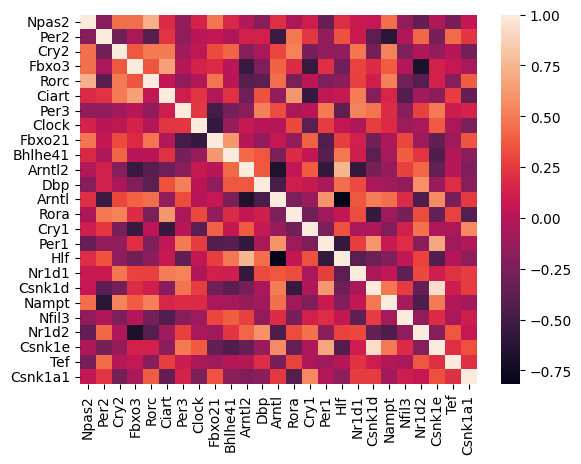

In [ ]:
modes_real_df = pd.DataFrame(model_dmd.W.real)
modes_real_corr = modes_real_df.T.corr()
modes_real_corr.index = tempo_df.iloc[:, 1:].columns.tolist()
modes_real_corr.columns = tempo_df.iloc[:, 1:].columns.tolist()

sns.heatmap(modes_real_corr)

<AxesSubplot:>

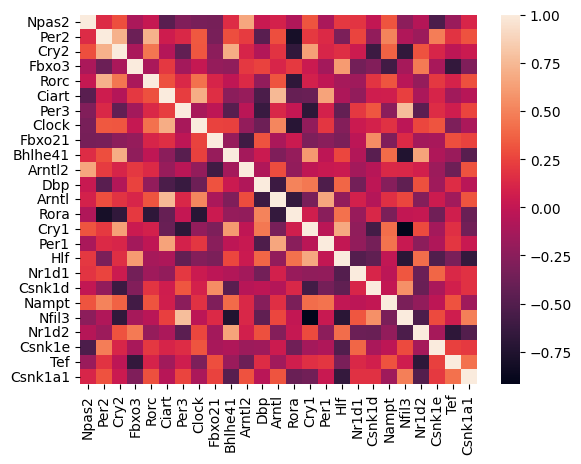

In [ ]:
modes_imag_df = pd.DataFrame(model_dmd.W.imag)
modes_imag_corr = modes_imag_df.T.corr()
modes_imag_corr.index = tempo_df.iloc[:, 1:].columns.tolist()
modes_imag_corr.columns = tempo_df.iloc[:, 1:].columns.tolist()

sns.heatmap(modes_imag_corr)

In [ ]:
model_dmd.phi()

<bound method Koopman.phi of Koopman(observables=Identity(),
        regressor=PyDMDRegressor(regressor=<pydmd.dmd.DMD object at 0x7f5b8038d450>))>

In [ ]:
def manual_covariance(x):
    mean = x.mean(axis=1)
    print(x.shape[1])
    cov = np.zeros((len(x), len(x)), dtype='complex64')

    for i in range(len(mean)):
        for k in range(len(mean)):
            s = 0
            for j in range(len(x[1])):  # 5 Col
                s += np.dot((x[i,j] - mean[i]), np.conj(x[k,j] - mean[i]))
            cov[i, k] = s / ((x.shape[1]) - 1)
    return cov

25


<ipython-input-41-4f5fb5d56a21>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, 'dmd_mouse_edmd_r25_cov.png'))
<ipython-input-41-4f5fb5d56a21>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, 'dmd_mouse_edmd_r25_cov.png'))
<ipython-input-41-4f5fb5d56a21>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, 'dmd_mouse_edmd_r25_cov.png'))
<ipython-input-41-4f5fb5d56a21>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no l

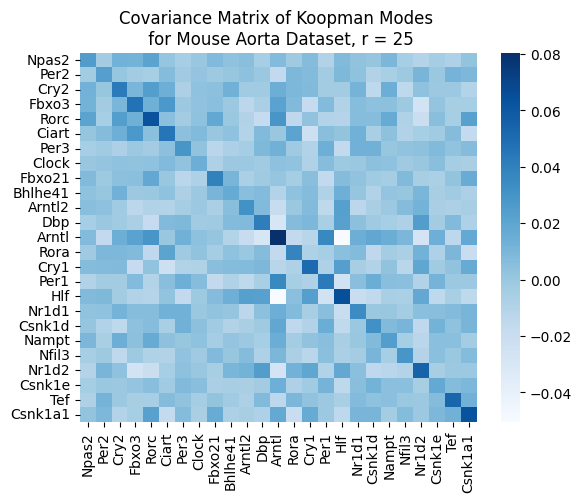

In [ ]:
modes_both_df = pd.DataFrame(manual_covariance(model_dmd.W).real,
                            index = tempo_df.iloc[:, 1:].columns.tolist(),
                            columns = tempo_df.iloc[:, 1:].columns.tolist()
                            )

sns.heatmap(modes_both_df,
            cmap = 'Blues',
            annot=False, xticklabels=True, yticklabels=True)
plt.title("Covariance Matrix of Koopman Modes \n" +
          " for Mouse Aorta Dataset, r = 25")
plt.savefig(os.path.join(plots_mouse_path, 'dmd_mouse_edmd_r25_cov.png'))

## Koopman / DMD Performance Metrics

### Pooled MSE

In [ ]:
koopman_pooled_mse = pooled_mse(true_df = tempo_df.iloc[:, 1:], pred_df = koopman_pred_df)

### R2

In [ ]:
koopman_pooled_r2 = r2_score(y_true = tempo_df.iloc[:, 1:], y_pred = koopman_pred_df)

### Summary of Performance Metrics

In [ ]:
print(f"Pooled MSE: {koopman_pooled_mse}")
print(f"R2: {koopman_pooled_r2}")

Pooled MSE: 0.0012452990406568094
R2: 0.7095859821973741


# Bayesian Lotka-Volterra

## Helper Functions

In [ ]:
# decorator with input and output types a Pytensor double float tensors
@as_op(itypes=[pt.dmatrix], otypes=[pt.dmatrix])

def pytensor_forward_model_matrix(theta):

    X0 = theta[0, :]
    r = theta[1, :]
    AX = theta[2, :]
    B = theta[3, :]

    return odeint(func=gLV, y0=X0,
                  t=tempo_df.time,
                  args=(r, AX, B))



def gLV(X, t, r, AX, B):
    return X * (r + AX) + B

## Specify Model

In [ ]:
# theta_glv4 = results_glv4.x  # least squares solution used to inform the priors
n = tempo_df.shape[1] - 1
with pm.Model() as model:

    priors = []

    # Params for X0
    X0 = pm.Uniform("X0",
                    lower=-5,
                    upper=5,
                    shape=n,
                    initval=tempo_df.iloc[1, 1:].values)
    priors.append(X0)

    # Params for r
    r = pm.Normal("r",
                  mu=0,
                  sigma=2,
                  shape=n)
    priors.append(r)


    # Params for A
    A = pm.Normal("A",
                  mu=0,
                  sigma=5,
                  shape=(n, n),
                  initval=tempo_df.iloc[:, 1:].cov().values)

    AX = pm.Deterministic(name = "AX", var = pm.math.dot(A, X0))
    priors.append(AX)

    # Params for linear term B
    B = pm.Normal("B",
                  mu=0,
                  sigma=5,
                  shape=n)
    priors.append(B)

    # Priors
    sigma = pm.HalfNormal("sigma", 2)

    # Ode solution function for Lotka-Volterra
    ode_solution = pytensor_forward_model_matrix(
        pm.math.stack(priors)
    )

    # Likelihood
    pm.Normal("Y_obs",
              mu=ode_solution,
              sigma=sigma,
              observed=tempo_df.iloc[:, 1:].values)

## Sampling

In [ ]:
# Variable list to give to the sample step parameter
vars_list = list(model.values_to_rvs.keys())[:-1]

# Specify the sampler
sampler = "Slice Sampler"
tune = draws = 100

# Inference!
with model:
    trace_slice = pm.sample(step=[pm.Metropolis(vars_list)],
                            tune = tune,
                            draws = draws,
                            progressbar = True)

trace = trace_slice
az_trace = az.summary(trace)
az_trace

/usr/lib/python3.11/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Illegal input detected (internal error). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/usr/lib/python3.11/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Illegal input detected (internal error). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.

Output()

ValueError: Not enough samples to build a trace.

In [ ]:
model.values_to_rvs.keys()

## Model 2

In [ ]:
# decorator with input and output types a Pytensor double float tensors
@as_op(itypes=[pt.dmatrix], otypes=[pt.dmatrix])

def pytensor_forward_model_matrix(theta):

    X0 = theta[0, :]
    r = theta[1, :]
    AX = theta[2, :]

    return odeint(func=gLV, y0=X0,
                  t=tempo_df.time,
                  args=(r, AX))



def gLV(X, t, r, AX):
    return X * (r + AX)

In [ ]:
# theta_glv4 = results_glv4.x  # least squares solution used to inform the priors
n = tempo_df.shape[1] - 1
with pm.Model() as model:

    priors = []

    # Params for X0
    X0 = pm.Uniform("X0",
                    lower=-15,
                    upper=0,
                    shape=n,
                    initval=tempo_df.iloc[1, 1:].values)
    priors.append(X0)

    # Params for r
    r = pm.Uniform("r",
                  lower=-15,
                    upper=0,
                  shape=n, initval=tempo_df.iloc[1, 1:].values)
    priors.append(r)


    # Params for A
    # A = pm.Normal("A",
    #               mu=0,
    #               sigma=5,
    #               shape=(n, n),
    #               initval=dinner_smooth.iloc[:, 1:].cov().values)
    A = pm.Uniform("A", lower = -15, upper = 0, shape = (n, n), initval = tempo_df.iloc[:, 1:].cov().values)

    AX = pm.Deterministic(name = "AX", var = pm.math.dot(A, X0))
    priors.append(AX)

    # Priors
    sigma = pm.HalfNormal("sigma", 10)

    # Ode solution function for Lotka-Volterra
    ode_solution = pytensor_forward_model_matrix(
        pm.math.stack(priors)
    )

    # Likelihood
    pm.Normal("Y_obs",
              mu=ode_solution,
              sigma=sigma,
              observed=tempo_df.iloc[:, 1:].values)

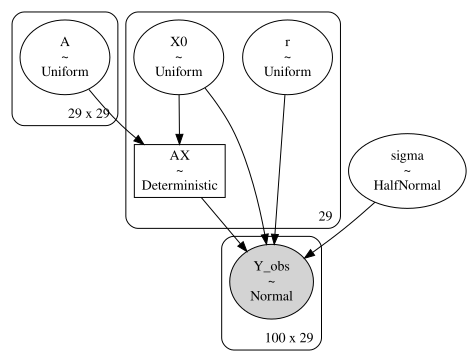

In [ ]:
pm.model_to_graphviz(model=model)


In [ ]:
# Variable list to give to the sample step parameter
vars_list = list(model.values_to_rvs.keys())[:-1]

# Specify the sampler
sampler = "Slice Sampler"
tune = draws = 100

# Inference!
with model:
    nuts_trace_slice = pm.sample(progressbar = False)

nuts_trace = nuts_trace_slice
az_nuts_trace = az.summary(nuts_trace)
az_nuts_trace

/usr/lib/python3.11/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.11/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Excess accuracy requested (tolerances too small). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Excess accuracy requested (tolerances too small). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/usr/local/lib/python3.11/dist-packages/scipy/inte

ParallelSamplingError: Chain 1 failed with: Bad initial energy: SamplerWarning(kind=<WarningType.BAD_ENERGY: 8>, message='Bad initial energy, check any log probabilities that are inf or -inf, nan or very small:\n[nan nan]\n.Try model.debug() to identify parametrization problems.', level='critical', step=0, exec_info=None, extra=None, divergence_point_source=None, divergence_point_dest=None, divergence_info=None)

## Evaluate Performance

## Get Posterior Params

In [ ]:
A_mh = az_trace.loc[az_trace['mean'].index.str.startswith('A['), 'mean'].values.reshape((n, n))
X0_mh = az_trace.loc[az_trace['mean'].index.str.startswith('X0'), 'mean'].values
r_mh = az_trace.loc[az_trace['mean'].index.str.startswith('r'), 'mean'].values
B_mh = az_trace.loc[az_trace['mean'].index.str.startswith('B'), 'mean'].values

A_mh_df = pd.DataFrame(A_mh,
                       columns = tempo_df.columns[1:],
                       index = tempo_df.columns[1:])
A_mh_df

In [ ]:
traj_mh = odeint(func=gLV, y0=X0_mh,
                  t=tempo_df.time,
                  args=(r_mh, A_mh @ X0_mh, B_mh))

bayesian_glv_pred_df = pd.DataFrame(traj_mh, columns = tempo_df.columns[1:])
bayesian_glv_pred_df

## Recreate Trajectories & Compare (Plot Predictions)

<ipython-input-94-912ad0e71161>:31: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, 'bglv_tempo2_traj_noraml.png'))
<ipython-input-94-912ad0e71161>:31: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, 'bglv_tempo2_traj_noraml.png'))
<ipython-input-94-912ad0e71161>:31: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, 'bglv_tempo2_traj_noraml.png'))
<ipython-input-94-912ad0e71161>:31: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer supported

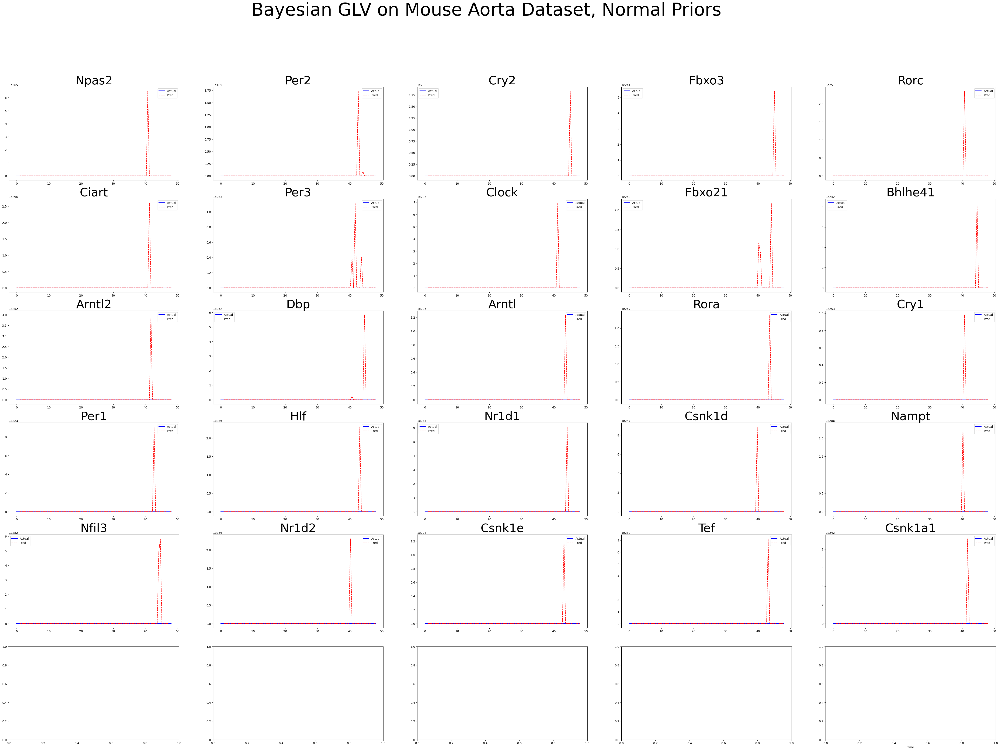

In [ ]:
fig, axs = plt.subplots(5, 5,
                        figsize=(60, 40), layout = "constrained")

gene_cols = tempo_df.iloc[:, 1:].columns.tolist()
time_vec_mh = tempo_df['time'].values

for col in range(bayesian_glv_pred_df.shape[1]):
  r, c = divmod(col, 5)

  colname = gene_cols[col]

  tempo_df.loc[:, colname].values

  axs[r, c].plot(time_vec_mh,
                 tempo_df.loc[:, colname].values,
                 '-',
                 color='b',
                 label='Actual', linewidth = 4.0)
  axs[r, c].plot(time_vec_mh,
                 bayesian_glv_pred_df.loc[:, colname].values,
                 '--r',
                 label='Pred', linewidth = 4.0)
  axs[r, c].legend()
  axs[r, c].set_title(colname, fontsize = 40)
  ax[r, c].tick_params(axis='both', which='major', labelsize=24)
  ax[r, c].tick_params(axis='both', which='minor', labelsize=20)


fig.supxlabel('Time (hours)', fontsize = 50)
fig.supylabel('scRNA-seq Readings', fontsize = 50)

handles, labels = ax[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize= 50)

# Plot
plt.xlabel('time')
suptitle_bglv = 'Bayesian GLV on Mouse Aorta Dataset, Normal Priors'
plt.suptitle(suptitle_bglv, fontsize = 60)
plt.savefig(os.path.join(plots_mouse_path, 'bglv_tempo2_traj_noraml.png'))
plt.show()

## Interaction Matrix Posterior Heatmap

<ipython-input-95-fa74d36f20ed>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, "bayes_glv_tempo2_normal.png"))
<ipython-input-95-fa74d36f20ed>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, "bayes_glv_tempo2_normal.png"))
<ipython-input-95-fa74d36f20ed>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, "bayes_glv_tempo2_normal.png"))
<ipython-input-95-fa74d36f20ed>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer supported as 

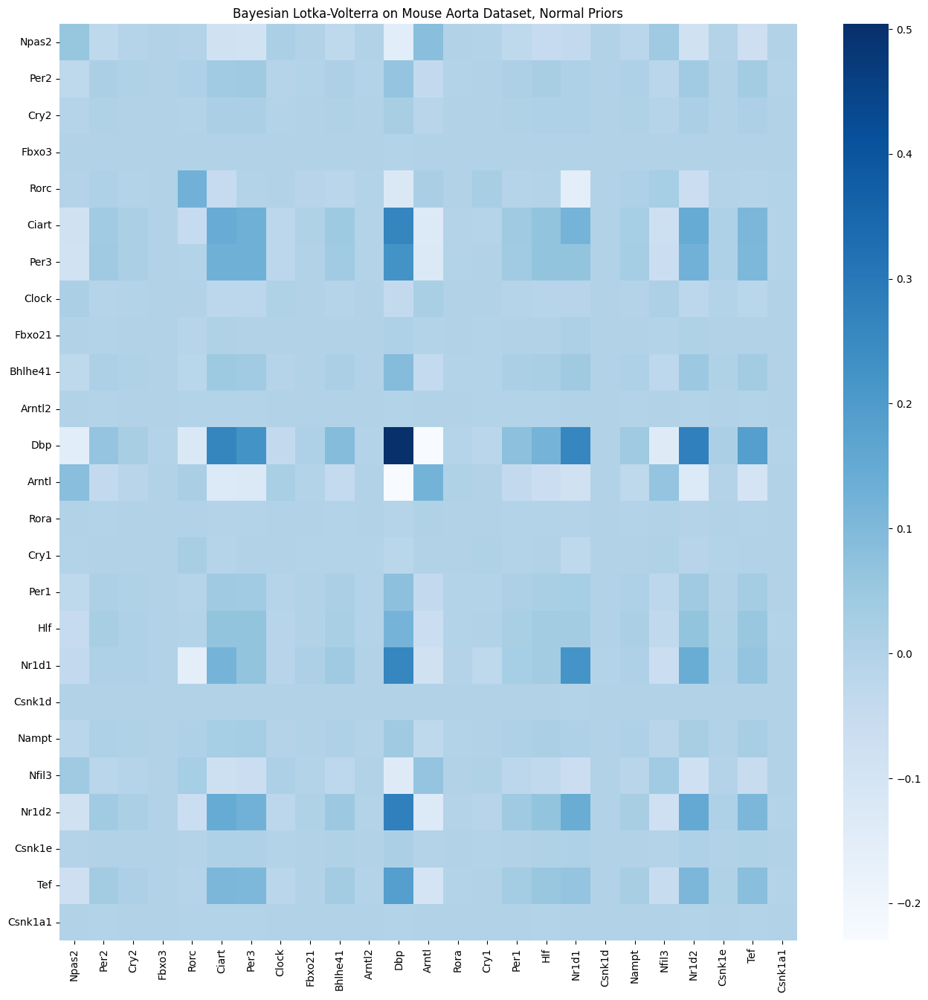

In [ ]:

plt.figure(figsize=(16,16))
sns.heatmap(A_mh_df, cmap = 'Blues', xticklabels=True, yticklabels=True)
plt.title('Bayesian Lotka-Volterra on Mouse Aorta Dataset, Normal Priors')
plt.savefig(os.path.join(plots_path, "bayes_glv_tempo2_normal.png"))


### Interaction Matrix Prior - Gene Covariance Matrix Heatmap

To benchmark how much $A$ changes in the posterior

<AxesSubplot:>

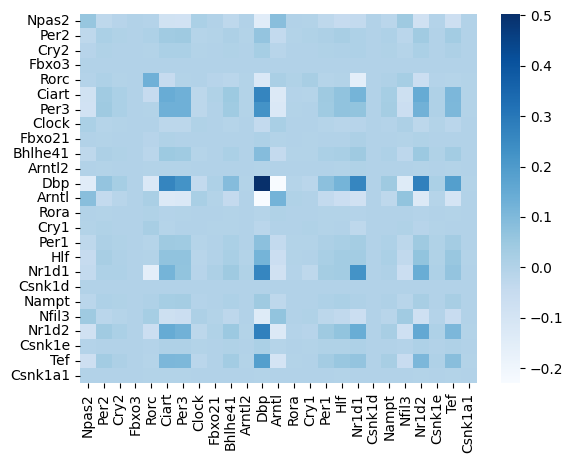

In [ ]:

sns.heatmap(tempo_df.iloc[:, 1:].cov(),
            cmap = 'Blues',
            xticklabels=True,
            yticklabels=True)


## Performance Metrics

### Pooled MSE

In [ ]:
bayes_glv_pooled_mse = pooled_mse(true_df = tempo_df.iloc[:, 1:], pred_df = bayesian_glv_pred_df)

### R2

In [ ]:
notnull_idx = bayesian_glv_pred_df.index[bayesian_glv_pred_df.isnull().sum(axis=1) == 0]

,time,KaiA-1,KaiA-2,KaiA-3,KaiA-4,KaiA-5,KaiA-6,KaiB-1,KaiB-2,KaiB-3,...,DNA-3,DNA-4,DNA-5,DNA-6,RpaA-1,RpaA-2,RpaA-3,RpaA-4,RpaA-5,RpaA-6
98,36.5,0.110,0.146,0.235,0.153,0.184,0.236,0.167,0.284,0.365,...,-0.394,-0.284,-0.287,-0.404,0.153,0.105,0.312,0.292,0.175,0.296
100,37.0,0.052,0.115,0.167,0.108,0.127,0.176,0.052,0.164,0.284,...,-0.272,-0.165,-0.164,-0.297,0.058,0.010,0.265,0.238,0.120,0.210
102,37.5,0.001,0.087,0.103,0.067,0.076,0.123,-0.049,0.056,0.210,...,-0.160,-0.056,-0.051,-0.198,-0.024,-0.074,0.216,0.185,0.070,0.132
104,38.0,-0.043,0.062,0.045,0.029,0.030,0.076,-0.140,-0.038,0.142,...,-0.059,0.042,0.050,-0.108,-0.096,-0.149,0.167,0.132,0.027,0.063
106,38.5,-0.082,0.040,-0.008,-0.004,-0.009,0.035,-0.220,-0.121,0.080,...,0.032,0.131,0.142,-0.025,-0.159,-0.215,0.119,0.080,-0.010,0.002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
344,98.0,0.083,0.802,0.255,0.204,0.243,0.278,0.181,0.435,0.497,...,-0.357,-0.234,-0.383,-0.234,-0.048,-0.165,0.510,0.353,0.229,0.173
346,98.5,0.055,0.775,0.230,0.158,0.204,0.256,0.124,0.363,0.437,...,-0.299,-0.212,-0.317,-0.167,-0.071,-0.175,0.538,0.373,0.212,0.158
348,99.0,0.021,0.745,0.201,0.101,0.158,0.228,0.054,0.274,0.362,...,-0.224,-0.178,-0.234,-0.082,-0.095,-0.184,0.561,0.389,0.186,0.135
350,99.5,-0.017,0.709,0.165,0.034,0.104,0.194,-0.028,0.167,0.270,...,-0.130,-0.132,-0.132,0.022,-0.121,-0.192,0.581,0.401,0.150,0.103


In [ ]:
bayesian_glv_pred_df.iloc[notnull_idx]

,Gene_0,Gene_1,Gene_10,Gene_11,Gene_12,Gene_13,Gene_14,Gene_15,Gene_16,Gene_17,...,Gene_5,Gene_6,Gene_7,Gene_8,Gene_9,Gene_147,Gene_153,Gene_363,Gene_437,Gene_8842
2,1.205199e+21,9.413375e-110,8.564860e+183,8.828937e+199,5.981576e-154,3.016946e+174,9.083668e+223,6.013470e-154,7.095232e-77,4.048680e-317,...,1.199859e+16,4.921127e+257,3.638595e+185,2.654272e+07,3.421279e+180,4.934328e+257,1.947674e+243,4.443877e+252,1.060978e-153,2.676426e+98
3,9.302223e+242,2.468800e-154,3.764387e+199,3.906463e+180,2.434699e-22,9.101611e+276,5.961002e+175,6.013345e-154,6.967642e+252,9.822021e+252,...,2.630347e+35,9.302208e+242,3.938414e+180,4.895606e-109,6.013470e-154,2.863763e+242,2.168544e+243,2.268907e+271,1.123199e+219,1.060838e-153
4,3.638512e+185,9.302142e+242,7.658495e+151,4.373391e+257,1.173675e-90,8.112799e+228,2.445506e-154,5.376250e+241,1.416686e-23,2.469529e-154,...,3.764387e+199,9.302207e+242,3.777103e+233,3.913556e-109,5.960760e+175,9.401609e+77,4.103294e+93,2.584150e+161,1.382075e+267,1.052457e-23
5,2.135216e+185,2.593386e+161,3.633184e+198,3.042123e-14,9.483763e-154,6.013470e-154,6.038218e+151,7.358764e+223,3.186615e+151,1.949309e+243,...,2.445517e-154,5.981299e-154,1.379452e+219,1.382013e+267,9.296031e+199,1.219061e-152,2.523000e-258,3.813883e+180,2.922268e-14,7.337324e+223
6,1.173306e+214,2.974678e+228,4.619647e+281,8.327238e+151,2.208138e-259,8.828937e+199,4.360446e+222,2.869818e-104,9.487297e+170,2.441411e-152,...,2.233207e+276,9.542197e+179,2.208136e-259,6.013470e-154,1.120394e+219,5.171129e-109,6.013470e-154,5.330482e+246,1.052619e-23,6.013470e-154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2.469529e-154,2.914471e+222,1.281532e-152,6.196352e+223,9.662951e+141,3.788584e-258,1.337170e-152,2.137809e+161,4.007196e-149,9.268130e+199,...,2.782608e+180,2.314636e-152,4.619648e+281,1.719649e+238,1.946732e+227,2.445506e-154,8.564860e+183,3.813883e+180,1.052625e-23,6.013470e-154
96,8.778533e+252,2.208229e-259,6.013470e-154,4.649931e-72,3.788584e-258,1.337170e-152,2.439056e-154,9.336021e+77,8.831336e+25,1.052619e-23,...,2.689134e+98,3.343798e+151,1.120389e+219,1.455543e-94,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,8.308079e+151
97,3.777062e+233,2.181743e+243,5.981493e-154,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,2.654259e+07,7.376453e+97,5.444533e-109,...,7.874881e+276,8.833939e+199,1.489775e+214,1.756310e-152,5.026205e+180,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154
98,2.210193e+68,2.661551e+06,1.395041e-152,1.817862e+185,1.876735e-152,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,6.013470e-154,...,6.013470e-154,6.013470e-154,5.349391e+59,6.013344e-154,4.710913e+180,5.349391e+59,6.013347e-154,4.771665e+180,1.062639e+248,2.445506e-154


In [ ]:
bayes_glv_r2 = r2_score(y_true = tempo_df.iloc[notnull_idx, 1:] // 10000, y_pred = bayesian_glv_pred_df.iloc[notnull_idx] // 10000)

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_regression.py:927: RuntimeWarning: overflow encountered in square
  numerator = (weight * (y_true - y_pred) ** 2).sum(axis=0, dtype=np.float64)


In [ ]:
bayes_glv_pooled_mse

59.16391660627018

In [ ]:
bayes_glv_r2

0.0

### Summary of Performance Metrics

# Summary Results Across Methods

<ipython-input-82-faa2d96baac5>:53: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, 'tempo2_all.png'))
<ipython-input-82-faa2d96baac5>:53: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, 'tempo2_all.png'))
<ipython-input-82-faa2d96baac5>:53: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_mouse_path, 'tempo2_all.png'))
<ipython-input-82-faa2d96baac5>:53: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer supported as of 3.3 and will b

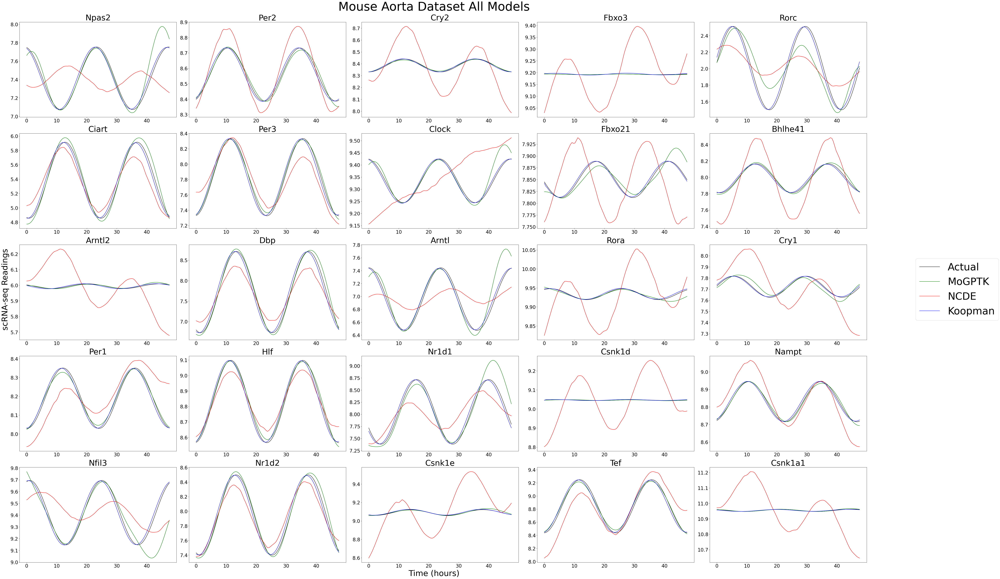

In [ ]:
fig, axs = plt.subplots(5, 5, figsize = (60, 40), layout = "constrained")

gene_cols = tempo_df.iloc[:, 1:].columns.tolist()

for col in range(ncde_pred_df.shape[1]):
  r, c = divmod(col, 5)

  colname = gene_cols[col]

  axs[r, c].plot(time_vec[:-1],
                 tempo_df.iloc[:-1, :].loc[:, colname].values,
                 '-',
                 color='0',
                 label='Actual')

  axs[r, c].plot(time_vec[:-1],
                 mogptk_preds_df.iloc[:-1, :].loc[:, colname].values,
                 'g',
                 label='MoGPTK')

  axs[r, c].plot(time_vec[:-1],
                ncde_pred_df.loc[:, colname].values,
                label = 'NCDE',
                color='r')

  axs[r, c].plot(time_vec[:-1],
                 koopman_pred_df.iloc[:-1, :].loc[:, colname].values,
                 label='Koopman',
                 color='b')

  # axs[r, c].plot(time_vec[:-1],
  #                bayesian_glv_pred_df.iloc[:-1, :].loc[:, colname].values,
  #                label='Bayes GLV',
  #                color='c')
  axs[r, c].set_title(colname, fontsize = 40)

fig.supxlabel('Time (hours)', fontsize = 40)
fig.supylabel('scRNA-seq Readings', fontsize = 40)

# Get handles and labels from one of the subplots
handles, labels = axs[0, 0].get_legend_handles_labels()

for a in axs.flatten():
    a.tick_params(axis='both', which='major', labelsize=24)
    a.tick_params(axis='both', which='minor', labelsize=20)

fig.legend(handles, labels, bbox_to_anchor=(1.05, 0.5), ncol = 1,
           loc='center left', fontsize = 50)

# fig.legend(bbox_to_anchor=(1.05, 0.5), ncol=2, loc='center left', fontsize = 40)
suptitle_all = 'Mouse Aorta Dataset All Models'
plt.suptitle(suptitle_all, fontsize = 60)
plt.savefig(os.path.join(plots_mouse_path, 'tempo2_all.png'))
plt.show()

# Appendix

## NCDE Trial Runs

### NCDE Run: 4/13/2025 6:35 PM, 500 steps

Finished control with CubicInterpolation(
  ts=f32[166], coeffs=[f32[165,31], f32[165,31], f32[165,31], f32[165,31]]
)
ts[0] shape: ()
y0 shape: (16,)
y_true: (32, 166, 30); y_pred: (32, 166, 30).
Step: 0, Loss: 3595.550537109375, Accuracy: 3595.550537109375, Computation time: 21.925617933273315
Step: 1, Loss: 3555.825927734375, Accuracy: 3555.825927734375, Computation time: 1.09849214553833
Step: 2, Loss: 3507.551025390625, Accuracy: 3507.551025390625, Computation time: 1.6345157623291016
Step: 3, Loss: 3487.687255859375, Accuracy: 3487.687255859375, Computation time: 0.76163649559021
Step: 4, Loss: 3472.209228515625, Accuracy: 3472.209228515625, Computation time: 0.6960725784301758
Step: 5, Loss: 3440.94921875, Accuracy: 3440.94921875, Computation time: 0.8357787132263184
Step: 6, Loss: 3413.404296875, Accuracy: 3413.404296875, Computation time: 0.8866899013519287
Step: 7, Loss: 3391.3505859375, Accuracy: 3391.3505859375, Computation time: 1.196861982345581
Step: 8, Loss: 3376.815917

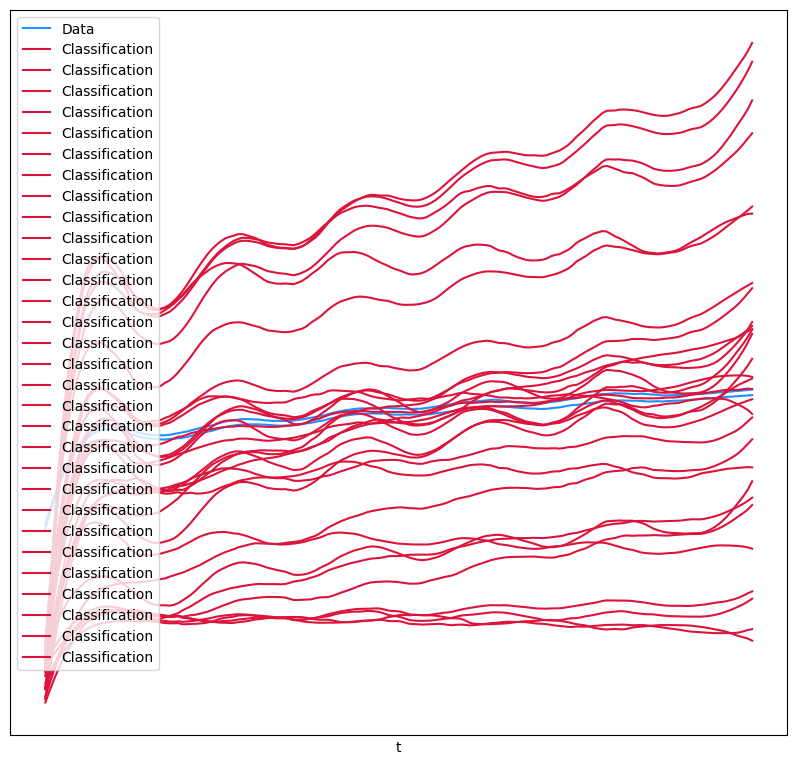

In [ ]:
# Training loop like normal.
### Model Instantiation ###
# NeuralCDEV2 is a class that takes in an (N, T - 1, G) tensor and the network architecture params.
# When instantiated (as done below)
model_sim = NeuralCDE(data_size = X_waveforms.shape[-1],
                      hidden_size = HIDDEN_SIZE,
                      width_size = WIDTH_SIZE,
                      output_size = OUTPUT_SIZE,
                      depth = DEPTH,
                      key = model_key)

### FUNCTIONS ###
def ncde_predict(model, ti, coeff_i, evolving_out = False):
    if evolving_out:
        def model_evolving(ts, coeffs):
            return model(ts, coeffs, evolving_out = True)
        return jax.vmap(model_evolving)(ti, coeff_i)
    else:
        return jax.vmap(model)(ti, coeff_i)

def compute_mse(y_true, y_pred, epsilon=1e-15):
    """
    MSE Loss for forecasting with real numbers
    """
    # if y_true.ndim == 3:
    #     y_true = y_true[:, 0, :]

    # Ensure predictions are clipped to avoid log(0)
    # y_pred = jnp.clip(y_pred, epsilon, 1 - epsilon)

    # Calculate the categorical cross-entropy
    # loss = jnp.mean(optax.l2_loss(y_pred, y_true))
    loss = jnp.mean((y_true - y_pred)**2, axis=1)

    # Return the mean loss over all samples
    return jnp.mean(loss)

@eqx.filter_jit
def loss(model, ti, y_true, coeff_i, evolving_out = False):
    pred = ncde_predict(model, ti, coeff_i, evolving_out = evolving_out)

    print(f"y_true: {y_true.shape}; y_pred: {pred.shape}.")

    # MSE
    mse_val = compute_mse(y_true = y_true, y_pred = pred)

    # mse_val = jnp.mean(mse_val)

    return mse_val, mse_val

# has_aux true will return two values: output to be differentiated and its gradient
grad_loss = eqx.filter_value_and_grad(loss, has_aux=True)

@eqx.filter_jit
def make_step(model, data_i, opt_state):
    ti, label_i, label_all_i, *coeff_i = data_i

    (mse_val, _), grads = grad_loss(model, ti, label_all_i, coeff_i, evolving_out = True)
    updates, opt_state = optim.update(grads, opt_state)
    model = eqx.apply_updates(model, updates)
    return mse_val, model, opt_state

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size


### EXECUTION ###
# Optional section
optim = optax.adam(1e-4)
opt_state = optim.init(eqx.filter(model_sim, eqx.is_inexact_array))
for step, data_i in zip(
    range(steps), dataloader((t_mat2d, y_waveforms, y_waveforms_evol) + coeffs, BATCH_SIZE, key=loader_key)
):
    start = time.time()
    mse_val, model_sim, opt_state = make_step(model_sim, data_i, opt_state)
    end = time.time()
    print(
        f"Step: {step}, Loss: {mse_val}, Accuracy: {mse_val}, Computation time: "
        f"{end - start}"
    )

# ts, coeffs, labels, _ = get_data(dataset_size, add_noise, key=test_data_key)
(mse_val, _) = loss(model = model_sim,
                    ti = t_mat2d,
                    y_true = y_waveforms,
                    coeff_i = coeffs)
print(f"Test loss: {mse_val}, Test Accuracy: {mse_val}")

# Plot results : Data Preparation for Plotting
sample_ts = t_mat2d[-1] # gets the last waveform in the dataset [size: (N_TIMEPOINTS - 1,)]
# coeffs is a list of four tensors for each cubic spliene coefficient,
# so we get, for each coefficient tensor, the last row which is the coefficients of the last tensor
sample_coeffs = tuple(c[-1] for c in coeffs)
# Get predictions for that waveform
pred = model_sim(sample_ts, sample_coeffs, evolving_out=True)
# This interpolates data for the coefficients
interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# Evaluates sample time series for the actual values
values = jax.vmap(interp.evaluate)(sample_ts)

# Plot 1
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1)

ax1.plot(sample_ts, values[:, 1], c="dodgerblue")
ax1.plot(sample_ts, values[:, 2], c="dodgerblue", label="Data")
ax1.plot(sample_ts, pred, c="crimson", label="Classification")
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlabel("t")
ax1.legend()

# Plot 2
# ax2 = fig.add_subplot(1, 2, 2, projection="3d")
# ax2.plot(values[:, 1], values[:, 2], c="dodgerblue", label="Data")
# ax2.plot(values[:, 1], values[:, 2], pred[:, 1], c="crimson", label="Classification")
# ax2.set_xticks([])
# ax2.set_yticks([])
# ax2.set_zticks([])
# ax2.set_xlabel("x")
# ax2.set_ylabel("y")
# ax2.set_zlabel("Classification")
plt.tight_layout()
plt.savefig("neural_cde.png")
plt.show()

### NCDE Run: 4/13/2025 6:25PM, 200 steps

Finished control with CubicInterpolation(
  ts=f32[166], coeffs=[f32[165,31], f32[165,31], f32[165,31], f32[165,31]]
)
ts[0] shape: ()
y0 shape: (16,)
y_true: (32, 166, 30); y_pred: (32, 166, 30).
Step: 0, Loss: 3595.26220703125, Accuracy: 3595.26220703125, Computation time: 26.537452697753906
Step: 1, Loss: 3555.12841796875, Accuracy: 3555.12841796875, Computation time: 0.9068377017974854
Step: 2, Loss: 3507.05810546875, Accuracy: 3507.05810546875, Computation time: 0.8603711128234863
Step: 3, Loss: 3488.76220703125, Accuracy: 3488.76220703125, Computation time: 0.7739553451538086
Step: 4, Loss: 3471.976318359375, Accuracy: 3471.976318359375, Computation time: 0.7465741634368896
Step: 5, Loss: 3441.75390625, Accuracy: 3441.75390625, Computation time: 0.8720881938934326
Step: 6, Loss: 3413.742919921875, Accuracy: 3413.742919921875, Computation time: 1.4321730136871338
Step: 7, Loss: 3391.753662109375, Accuracy: 3391.753662109375, Computation time: 2.754321813583374
Step: 8, Loss: 3376.

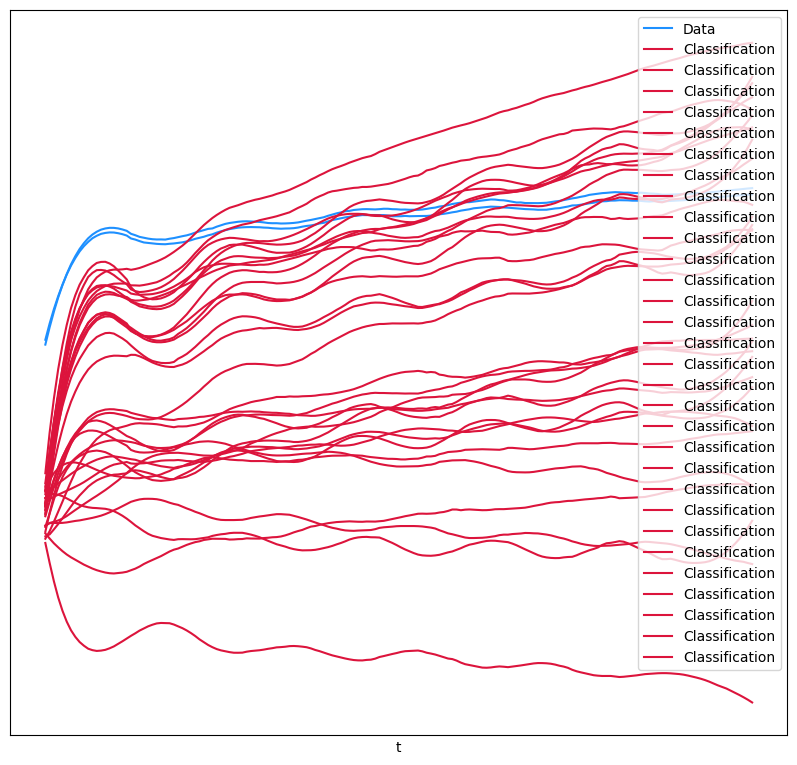

In [ ]:
# Training loop like normal.
### Model Instantiation ###
# NeuralCDEV2 is a class that takes in an (N, T - 1, G) tensor and the network architecture params.
# When instantiated (as done below)
model_sim = NeuralCDE(data_size = X_waveforms.shape[-1],
                      hidden_size = HIDDEN_SIZE,
                      width_size = WIDTH_SIZE,
                      output_size = OUTPUT_SIZE,
                      depth = DEPTH,
                      key = model_key)

### FUNCTIONS ###
def ncde_predict(model, ti, coeff_i, evolving_out = False):
    if evolving_out:
        def model_evolving(ts, coeffs):
            return model(ts, coeffs, evolving_out = True)
        return jax.vmap(model_evolving)(ti, coeff_i)
    else:
        return jax.vmap(model)(ti, coeff_i)

def compute_mse(y_true, y_pred, epsilon=1e-15):
    """
    MSE Loss for forecasting with real numbers
    """
    # if y_true.ndim == 3:
    #     y_true = y_true[:, 0, :]

    # Ensure predictions are clipped to avoid log(0)
    # y_pred = jnp.clip(y_pred, epsilon, 1 - epsilon)

    # Calculate the categorical cross-entropy
    # loss = jnp.mean(optax.l2_loss(y_pred, y_true))
    loss = jnp.mean((y_true - y_pred)**2, axis=1)

    # Return the mean loss over all samples
    return jnp.mean(loss)

@eqx.filter_jit
def loss(model, ti, y_true, coeff_i, evolving_out = False):
    pred = ncde_predict(model, ti, coeff_i, evolving_out = evolving_out)

    print(f"y_true: {y_true.shape}; y_pred: {pred.shape}.")

    # MSE
    mse_val = compute_mse(y_true = y_true, y_pred = pred)

    # mse_val = jnp.mean(mse_val)

    return mse_val, mse_val

# has_aux true will return two values: output to be differentiated and its gradient
grad_loss = eqx.filter_value_and_grad(loss, has_aux=True)

@eqx.filter_jit
def make_step(model, data_i, opt_state):
    ti, label_i, label_all_i, *coeff_i = data_i

    (mse_val, _), grads = grad_loss(model, ti, label_all_i, coeff_i, evolving_out = True)
    updates, opt_state = optim.update(grads, opt_state)
    model = eqx.apply_updates(model, updates)
    return mse_val, model, opt_state

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size


### EXECUTION ###
# Optional section
optim = optax.adam(1e-4)
opt_state = optim.init(eqx.filter(model_sim, eqx.is_inexact_array))
for step, data_i in zip(
    range(steps), dataloader((t_mat2d, y_waveforms, y_waveforms_evol) + coeffs, BATCH_SIZE, key=loader_key)
):
    start = time.time()
    mse_val, model_sim, opt_state = make_step(model_sim, data_i, opt_state)
    end = time.time()
    print(
        f"Step: {step}, Loss: {mse_val}, Accuracy: {mse_val}, Computation time: "
        f"{end - start}"
    )

# ts, coeffs, labels, _ = get_data(dataset_size, add_noise, key=test_data_key)
(mse_val, _) = loss(model = model_sim,
                    ti = t_mat2d,
                    y_true = y_waveforms,
                    coeff_i = coeffs)
print(f"Test loss: {mse_val}, Test Accuracy: {mse_val}")

# Plot results : Data Preparation for Plotting
sample_ts = t_mat2d[-1] # gets the last waveform in the dataset [size: (N_TIMEPOINTS - 1,)]
# coeffs is a list of four tensors for each cubic spliene coefficient,
# so we get, for each coefficient tensor, the last row which is the coefficients of the last tensor
sample_coeffs = tuple(c[-1] for c in coeffs)
# Get predictions for that waveform
pred = model_sim(sample_ts, sample_coeffs, evolving_out=True)
# This interpolates data for the coefficients
interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# Evaluates sample time series for the actual values
values = jax.vmap(interp.evaluate)(sample_ts)

# Plot 1
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1)

ax1.plot(sample_ts, values[:, 1], c="dodgerblue")
ax1.plot(sample_ts, values[:, 2], c="dodgerblue", label="Data")
ax1.plot(sample_ts, pred, c="crimson", label="Classification")
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlabel("t")
ax1.legend()

# Plot 2
# ax2 = fig.add_subplot(1, 2, 2, projection="3d")
# ax2.plot(values[:, 1], values[:, 2], c="dodgerblue", label="Data")
# ax2.plot(values[:, 1], values[:, 2], pred[:, 1], c="crimson", label="Classification")
# ax2.set_xticks([])
# ax2.set_yticks([])
# ax2.set_zticks([])
# ax2.set_xlabel("x")
# ax2.set_ylabel("y")
# ax2.set_zlabel("Classification")
plt.tight_layout()
plt.savefig("neural_cde.png")
plt.show()

### NCDE Run: 4/13/2025 6:00PM, 100 steps

Finished control with CubicInterpolation(
  ts=f32[166], coeffs=[f32[165,31], f32[165,31], f32[165,31], f32[165,31]]
)
y_true: (32, 166, 30); y_pred: (32, 166, 30).
Step: 0, Loss: 3595.312744140625, Accuracy: 3595.312744140625, Computation time: 19.95695424079895
Step: 1, Loss: 3555.794921875, Accuracy: 3555.794921875, Computation time: 1.4375996589660645
Step: 2, Loss: 3506.536376953125, Accuracy: 3506.536376953125, Computation time: 1.3460593223571777
Step: 3, Loss: 3487.83447265625, Accuracy: 3487.83447265625, Computation time: 1.1185424327850342
Step: 4, Loss: 3472.236083984375, Accuracy: 3472.236083984375, Computation time: 0.6792178153991699
Step: 5, Loss: 3441.907470703125, Accuracy: 3441.907470703125, Computation time: 0.7658653259277344
Step: 6, Loss: 3413.754150390625, Accuracy: 3413.754150390625, Computation time: 0.8729970455169678
Step: 7, Loss: 3391.171630859375, Accuracy: 3391.171630859375, Computation time: 1.066856861114502
Step: 8, Loss: 3376.109130859375, Accuracy: 3

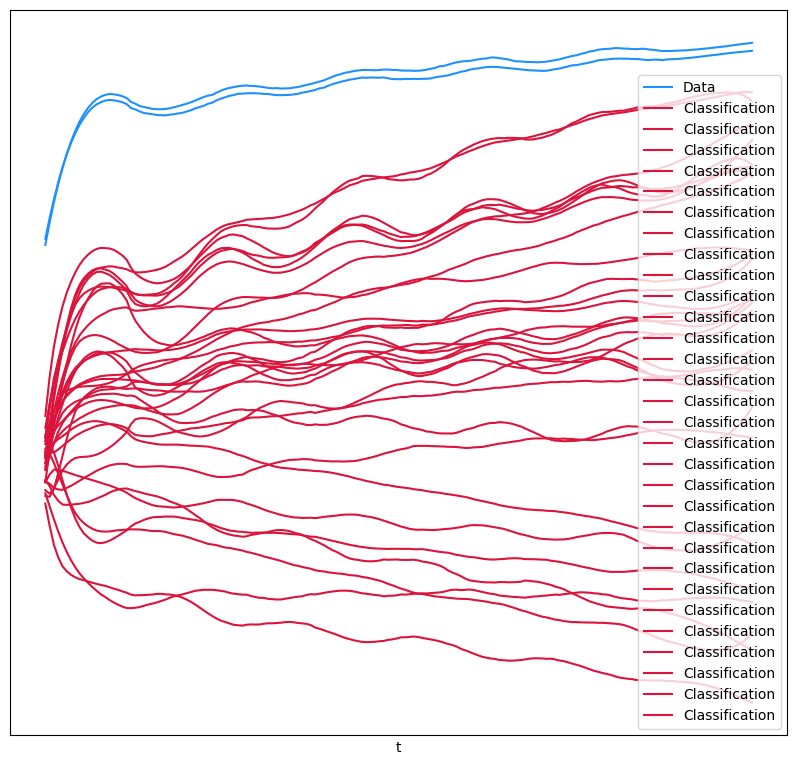

In [ ]:
# Training loop like normal.
### Model Instantiation ###
# NeuralCDEV2 is a class that takes in an (N, T - 1, G) tensor and the network architecture params.
# When instantiated (as done below)
model_sim = NeuralCDE(data_size = X_waveforms.shape[-1],
                      hidden_size = HIDDEN_SIZE,
                      width_size = WIDTH_SIZE,
                      output_size = OUTPUT_SIZE,
                      depth = DEPTH,
                      key = model_key)

### FUNCTIONS ###
def ncde_predict(model, ti, coeff_i, evolving_out = False):
    if evolving_out:
        def model_evolving(ts, coeffs):
            return model(ts, coeffs, evolving_out = True)
        return jax.vmap(model_evolving)(ti, coeff_i)
    else:
        return jax.vmap(model)(ti, coeff_i)

def compute_mse(y_true, y_pred, epsilon=1e-15):
    """
    MSE Loss for forecasting with real numbers
    """
    # if y_true.ndim == 3:
    #     y_true = y_true[:, 0, :]

    # Ensure predictions are clipped to avoid log(0)
    # y_pred = jnp.clip(y_pred, epsilon, 1 - epsilon)

    # Calculate the categorical cross-entropy
    # loss = jnp.mean(optax.l2_loss(y_pred, y_true))
    loss = jnp.mean((y_true - y_pred)**2, axis=1)

    # Return the mean loss over all samples
    return jnp.mean(loss)

@eqx.filter_jit
def loss(model, ti, y_true, coeff_i, evolving_out = False):
    pred = ncde_predict(model, ti, coeff_i, evolving_out = evolving_out)

    print(f"y_true: {y_true.shape}; y_pred: {pred.shape}.")

    # MSE
    mse_val = compute_mse(y_true = y_true, y_pred = pred)

    # mse_val = jnp.mean(mse_val)

    return mse_val, mse_val

# has_aux true will return two values: output to be differentiated and its gradient
grad_loss = eqx.filter_value_and_grad(loss, has_aux=True)

@eqx.filter_jit
def make_step(model, data_i, opt_state):
    ti, label_i, label_all_i, *coeff_i = data_i

    (mse_val, _), grads = grad_loss(model, ti, label_all_i, coeff_i, evolving_out = True)
    updates, opt_state = optim.update(grads, opt_state)
    model = eqx.apply_updates(model, updates)
    return mse_val, model, opt_state

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size


### EXECUTION ###
# Optional section
optim = optax.adam(1e-4)
opt_state = optim.init(eqx.filter(model_sim, eqx.is_inexact_array))
for step, data_i in zip(
    range(steps), dataloader((t_mat2d, y_waveforms, y_waveforms_evol) + coeffs, BATCH_SIZE, key=loader_key)
):
    start = time.time()
    mse_val, model_sim, opt_state = make_step(model_sim, data_i, opt_state)
    end = time.time()
    print(
        f"Step: {step}, Loss: {mse_val}, Accuracy: {mse_val}, Computation time: "
        f"{end - start}"
    )

# ts, coeffs, labels, _ = get_data(dataset_size, add_noise, key=test_data_key)
(mse_val, _) = loss(model = model_sim,
                    ti = t_mat2d,
                    y_true = y_waveforms,
                    coeff_i = coeffs)
print(f"Test loss: {mse_val}, Test Accuracy: {mse_val}")

# Plot results : Data Preparation for Plotting
sample_ts = t_mat2d[-1] # gets the last waveform in the dataset [size: (N_TIMEPOINTS - 1,)]
# coeffs is a list of four tensors for each cubic spliene coefficient,
# so we get, for each coefficient tensor, the last row which is the coefficients of the last tensor
sample_coeffs = tuple(c[-1] for c in coeffs)
# Get predictions for that waveform
pred = model_sim(sample_ts, sample_coeffs, evolving_out=True)
# This interpolates data for the coefficients
interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# Evaluates sample time series for the actual values
values = jax.vmap(interp.evaluate)(sample_ts)

# Plot 1
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1)

ax1.plot(sample_ts, values[:, 1], c="dodgerblue")
ax1.plot(sample_ts, values[:, 2], c="dodgerblue", label="Data")
ax1.plot(sample_ts, pred, c="crimson", label="Classification")
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlabel("t")
ax1.legend()

# Plot 2
# ax2 = fig.add_subplot(1, 2, 2, projection="3d")
# ax2.plot(values[:, 1], values[:, 2], c="dodgerblue", label="Data")
# ax2.plot(values[:, 1], values[:, 2], pred[:, 1], c="crimson", label="Classification")
# ax2.set_xticks([])
# ax2.set_yticks([])
# ax2.set_zticks([])
# ax2.set_xlabel("x")
# ax2.set_ylabel("y")
# ax2.set_zlabel("Classification")
plt.tight_layout()
plt.savefig("neural_cde.png")
plt.show()

## Train-test split